<a href="https://colab.research.google.com/github/nomi181472/MS-DS-Practice/blob/main/Time_Series_Analysis_and_Forecasting_Using_Karachi_Stock_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**installing  Packages**


In [ ]:
import warnings
warnings.filterwarnings('ignore')
!pip install gdown
!pip install chart_studio
!pip install tqdm
!pip install darts
!pip install scikeras
!pip install dtw-python

#**Downloading  and Unziping dataset**


In [ ]:
import gdown

In [ ]:
#international Companies Stocks
zip_link='https://drive.google.com/u/0/uc?id=1jC6l6t52ntacqrjFjCjPC5fixZIJ-oOx&export=download'
file_name_with_ext='dataset.zip'


gdown.download(zip_link, file_name_with_ext, quiet=False)

folder_name="stock_ohlc"
!unzip -o {file_name_with_ext} -d {folder_name}
folder_name=f"/content/f{folder_name}/stock_ohlc"

Downloading...
From: https://drive.google.com/u/0/uc?id=1jC6l6t52ntacqrjFjCjPC5fixZIJ-oOx&export=download
To: /content/dataset.zip

100%|██████████| 479k/479k [00:00<00:00, 5.27MB/s]


Archive:  dataset.zip
  inflating: stock_ohlc/stock_ohlc/AAPL.csv  
  inflating: stock_ohlc/stock_ohlc/AMD.csv  
  inflating: stock_ohlc/stock_ohlc/AMZN.csv  
  inflating: stock_ohlc/stock_ohlc/META.csv  
  inflating: stock_ohlc/stock_ohlc/MSFT.csv  
  inflating: stock_ohlc/stock_ohlc/NFLX.csv  
  inflating: stock_ohlc/stock_ohlc/Nvidia.csv  
  inflating: stock_ohlc/stock_ohlc/QCOM.csv  
  inflating: stock_ohlc/stock_ohlc/SBUX.csv  
  inflating: stock_ohlc/stock_ohlc/TSLA.csv  


In [ ]:
#karachi stocks
zip_link='https://drive.google.com/uc?id=1NVdi_phk2QfCRhdzZZjTAhEYB9xIb9a9&export=download'
file_name_with_ext='khi_stocks.zip'


gdown.download(zip_link, file_name_with_ext, quiet=False)
folder_name="karachi_stock"
!unzip -o {file_name_with_ext} -d {folder_name}
folder_name=f"/content/{folder_name}/KarachiStockExchange"

Downloading...
From: https://drive.google.com/uc?id=1NVdi_phk2QfCRhdzZZjTAhEYB9xIb9a9&export=download
To: /content/khi_stocks.zip

  0%|          | 0.00/15.9M [00:00<?, ?B/s]
  7%|▋         | 1.05M/15.9M [00:00<00:01, 8.65MB/s]
100%|██████████| 15.9M/15.9M [00:00<00:00, 63.7MB/s]


Archive:  khi_stocks.zip
  inflating: karachi_stock/KarachiStockExchange/About Dataset.txt  
  inflating: karachi_stock/KarachiStockExchange/UQAB.csv  
  inflating: karachi_stock/KarachiStockExchange/WEBF.csv  
  inflating: karachi_stock/KarachiStockExchange/SPL.csv  
  inflating: karachi_stock/KarachiStockExchange/ZAMT.csv  
  inflating: karachi_stock/KarachiStockExchange/ZAHID.csv  
  inflating: karachi_stock/KarachiStockExchange/SNKA.csv  
  inflating: karachi_stock/KarachiStockExchange/YOUW.csv  
  inflating: karachi_stock/KarachiStockExchange/TRPOL.csv  
  inflating: karachi_stock/KarachiStockExchange/SURAJ.csv  
  inflating: karachi_stock/KarachiStockExchange/SMBL.csv  
  inflating: karachi_stock/KarachiStockExchange/SSML.csv  
  inflating: karachi_stock/KarachiStockExchange/SZTM.csv  
  inflating: karachi_stock/KarachiStockExchange/UMEF.csv  
  inflating: karachi_stock/KarachiStockExchange/STML.csv  
  inflating: karachi_stock/KarachiStockExchange/SLSO.csv  
  inflating: karachi

#**Importing Libaries**

In [ ]:
#libraries
import pandas as pd
from  tqdm import tqdm
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
# Above is a special style template for matplotlib, highly useful for visualizing time series data
%matplotlib inline
import seaborn as sns
from scipy.stats import norm
import random

import datetime
from datetime import timedelta
import os
from tqdm import tqdm
import yfinance as yf
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import copy

import yfinance as yf
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import warnings
warnings.filterwarnings('ignore')


%matplotlib inline
from pylab import rcParams
from plotly import tools
import chart_studio.plotly as py

from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.figure_factory as ff
import statsmodels.api as sm
from numpy.random import normal, seed
from scipy.stats import norm
from statsmodels.tsa.arima_model import ARMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.tsa.arima_model import ARIMA
import math
from sklearn.metrics import mean_squared_error
import copy
from pandas.plotting import lag_plot

from sklearn.linear_model import LinearRegression
import pandas as pd
import matplotlib.pyplot as plt
from pylab import rcParams
import numpy as np
import seaborn as sns
import os

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV
from sklearn.feature_selection import RFECV, SelectFromModel, SelectKBest
from sklearn.preprocessing import StandardScaler
from sklearn import metrics



from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense
from scikeras.wrappers import KerasRegressor
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
import matplotlib.dates as mdates

from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

from sklearn.ensemble import (
    VotingRegressor
)
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge, LinearRegression,Lasso,BayesianRidge,SGDRegressor,ElasticNet,ARDRegression





from sklearn.metrics import  mean_squared_error
from darts import TimeSeries
from darts.models import NBEATSModel
from darts.dataprocessing.transformers import Scaler, MissingValuesFiller
from darts.metrics import mape, r2_score
"""Interpretable model¶
N-BEATS offers an interpretable architecture consisting of two stacks: A trend stack and a seasonality stack. The architecture is designed so that:

The trend component is removed from the input before it is fed into the seasonality stack

The partial forecasts of trend and seasonality are available as separate interpretable outputs"""


from sklearn.ensemble import (
    VotingRegressor
)
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge, LinearRegression,Lasso,BayesianRidge,SGDRegressor,ElasticNet,ARDRegression
from keras.layers import LSTM
from sklearn.preprocessing import StandardScaler
# Set random state
def fix_all_seeds(seed):
    np.random.seed(seed)
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)

random_state = 4
all_abbrev=["META"]
fix_all_seeds(random_state)


#**Implemented classes**

In [ ]:


class DataReader:
  def __init__(self,dataset_path,format="csv",):
    self.dataset_path=dataset_path
    self.format=format
  def read_multiple_campanies(self,date_index_col_name="Date",parse_dates=True):
    dataset={}
    files = os.listdir(self.dataset_path)
    for i in tqdm(range(len(files[:]))):
      file=files[i]
      try:
        company_name=file[:-4]
        ext=file[-3:]
        if company_name not in dataset and ext==self.format:
          path=f'{self.dataset_path}/{file}'
          dataset[company_name]=pd.read_csv(path,index_col=date_index_col_name,parse_dates=parse_dates)
      except e:
        print(f"exception: {e}")
        print(f"file location {path}")
    return dataset


def handle_missing_values(prev_row,next_row,columns,missing_date):

    if prev_row.isna().all().all()==False and next_row.isna().all().all()==False:
      return pd.DataFrame((np.array(prev_row)+np.array(next_row))/2,columns=columns,index=[missing_date])

    elif prev_row.isna().all().all() and next_row.isna().all().all()==False:
      return   pd.DataFrame(next_row,index=[missing_date])
    elif prev_row.isna().all().all()==False and next_row.isna().all().all():

      return  pd.DataFrame(prev_row,index=[missing_date])
    else:
      return prev_row

def fill_missing_dates(row,pdf,p_col):
  if row.isna().all():

    index=row.name
    pdf=pdf[p_col]
    #print(type(index))
    filtered=pdf[index-timedelta(days=100):index-timedelta(days=1)]

    prev_row=filtered.dropna().tail(1)

    filtered=pdf[index+timedelta(days=1):index+timedelta(days=100) ]
    next_row=filtered.dropna().head(1)
    value=handle_missing_values(prev_row,next_row,prev_row.columns,index)
    #print(value.loc[index])

    if value.isna().all().all():
      return row
    else:
      return value.loc[index]
  else:
    #print(row)

    return row
#d=ohlc_df.apply(fill_missing_dates,axis=1,)

class Utility:
  def __init__(self):
    pass
  def cancatenate_mutiple_stocks(self,p_dataset_dict,names,new_column_name="symbol"):
    df=pd.DataFrame()
    for name in names:
      k=name
      tdf=p_dataset_dict[name]
      tdf[new_column_name]=k
      df=pd.concat([tdf,df])
    return df
  def merge_companies_into_single_df(self,dataset,columns):

    df=pd.DataFrame(columns=columns)
    for key,sub_df in dataset.items():
      if "Symbol" not in columns:
        df["Symbol"]=key
      df=pd.concat([df,sub_df])
    return df


  def reduce_dataset(self,dataset,days_threshold=0):
    df=pd.DataFrame(columns=["Symbol","Days_count"])
    pre_dataset=dataset.copy()
    for i,pairs in enumerate(dataset.items()):
      key,d=pairs
      no_of_days=d.count()[-1]

      if no_of_days>days_threshold:
        print("")
        df=pd.concat([df,pd.DataFrame({"Symbol":[key],"Days_count":[no_of_days]},),])
        df=df.reset_index(drop=True)
        df_sorted = df.sort_values(by='Days_count', ascending=False)
        df_sorted["Symbol_Ids"]=list(range(0,df["Symbol"].count()))
      else:
        del pre_dataset[key]


    return df_sorted,pre_dataset
  def handle_missing_values(self,dataset,exclude_holiday=True):
    for key in tqdm(dataset.keys()):
      tf=dataset[key]
      complete_date_range = pd.date_range(start=tf.index.min(), end=tf.index.max(), freq='D')
      if exclude_holiday:
        cond=complete_date_range.strftime("%A").isin(["Sunday","Saturday"])
        complete_date_range=complete_date_range[~cond]
      tf = tf.reindex(complete_date_range)
      p_col=["Open","Low","Close","High","Volume"]
      tf[p_col]=tf[p_col].apply(fill_missing_dates,args=(tf,p_col),axis=1,)
      tf=tf.fillna(method="ffill")
      tf=tf.fillna(method="bfill")
      dataset[key]=tf
    return dataset
  def replace_values_from_multiple_columns(self,columns_names,to_replace,value,dataset,end_type):
    data=dataset.copy()
    for (key,df) in tqdm(companies_dict.items()):
      data[key][columns_names]=data[key][columns_names].astype("string").apply(lambda col: col.str.replace(to_replace, value,regex=False)).astype(end_type)
    return data
  def count_missing_dates(self,start_date,end_date,dataset,exclude_holiday=True):
    import numpy as np
    complete_date_range = pd.date_range(start=start_date, end=end_date, freq='D')
    if exclude_holiday:
      cond=complete_date_range.strftime("%A").isin(["Sunday","Saturday"])
      complete_date_range[~cond]=complete_date_range[~cond]
    universal_set=set(complete_date_range)
    missing_days_count=[]
    for k,dfi in dataset.items():
      missing_days_count.append(len(universal_set-set(dfi.index)))
    return missing_days_count

  def fill_missing_dates(row,pdf,p_col):
    if row.isna().all():
      index=row.name
      pdf=pdf[p_col]
      #print(type(index))
      filtered=pdf[index-timedelta(days=100):index-timedelta(days=1)]

      prev_row=filtered.dropna().tail(1)

      filtered=pdf[index+timedelta(days=1):index+timedelta(days=100) ]
      next_row=filtered.dropna().head(1)
      value=handle_missing_values(prev_row,next_row,prev_row.columns,index)
      #print(value.loc[index])

      if value.isna().all().all():
        return row
      else:
        return value.loc[index]
    else:
      #print(row)
      return row




class Visualization:
  def __init__(self):
      pass

  def plot_pca_components(self,data,name):

    data = data[["Close","Open","High","Low"]]

    data_std = (data - data.mean()) / data.std()


    pca = PCA(n_components=4)
    principal_components = pca.fit_transform(data_std)


    explained_variance = pca.explained_variance_ratio_


    plt.figure(figsize=(12, 8))
    plt.bar(["PC1", "PC2", "PC3", "PC4"], explained_variance * 100)
    for i, p in enumerate(explained_variance):
        plt.text(i, p * 100 + 0.2, f"{p:.2f}", ha="center")
    plt.xlabel("Principal Component")
    plt.ylabel("Explained Variance Ratio (%)")
    plt.title(f"Explained Variance by Principal Components (with PC values) on {name}")
    plt.tight_layout()
    plt.show()


    print("Explained Variance:")
    print(f"PC1: {explained_variance[0]:.4f}")
    print(f"PC2: {explained_variance[1]:.4f}")
    print(f"PC3: {explained_variance[2]:.4f}")
    print(f"PC4: {explained_variance[3]:.4f}")

    component_loadings = pca.components_.T


    print("\nComponent Loadings:")
    print(pd.DataFrame(component_loadings, columns=["Open", "High", "Low", "Close"], index=[f"PC{i+1}" for i in range(4)]))
  def plot_networth(self,ohlc_data,):


    net_worth_per_company = {}
    for company, data in ohlc_data.items():
        open_price = data["Open"][0]
        close_price = data["Close"][-1]
        net_worth = 500 * (close_price - open_price)
        net_worth_per_company[company] = net_worth

    # Print the net worth for each company
    for company, net_worth in net_worth_per_company.items():
        print(f"Net worth for {company}:", net_worth)

    # Create a bar chart to visualize the net worth for each company
    fig, ax = plt.subplots(figsize=(10, 6))
    stocks = list(net_worth_per_company.keys())
    net_worth_values = list(net_worth_per_company.values())
    ax.bar(stocks, net_worth_values)

    ax.set_xlabel("Company")
    ax.set_ylabel("Net Worth")
    ax.set_title("Net Worth for Each Company")
    plt.xticks(rotation=45, ha="right")
    plt.show()
  def plot_up_down_count_for_multiple_stocks(self,p_dict_data,names,no_of_year):
    x=[]
    y1=[]
    y2=[]
    for  name in names:
      k=name
      tdf=p_dict_data[name]
      last_date=tdf.iloc[-1].name
      start_date = str(last_date-pd.DateOffset(years=no_of_year))
      end_date = str(last_date)
      tdf = tdf[(tdf.index >= start_date) & (tdf.index <= end_date)]
      # Calculate the daily gaps
      tdf["Gap"] = tdf["Open"] - tdf["Close"].shift(1)
      # Count the number of gap ups and gap downs
      gap_up_count = tdf[tdf["Gap"] > 0].shape[0]
      gap_down_count = tdf[tdf["Gap"] < 0].shape[0]
      x.append(k)
      y1.append(gap_up_count)
      y2.append(gap_down_count)

    # plot bars in stack manner

    plt.figure(figsize=(16, 10), dpi=80)
    plt.bar(x, y1, color='black')
    plt.bar(x, y2, bottom=y1, color='Grey')
    plt.xlabel("Symbols")
    plt.ylabel("Price")
    plt.legend(['Up',"Down"])
    plt.title("Scores by Teams in 4 Rounds")
    plt.show()


  def plot_up_down_count(self,tdf,symbol,no_of_year=10):
    """Q1: How many times did company A experience a gap up or a gap down in the last 10 years?"""
    last_date=tdf.iloc[-1].name
    start_date = str(last_date-pd.DateOffset(years=no_of_year))
    end_date = str(last_date)
    tdf = tdf[(tdf.index >= start_date) & (tdf.index <= end_date)]
    # Calculate the daily gaps
    tdf["Gap"] = tdf["Open"] - tdf["Close"].shift(1)
    # Count the number of gap ups and gap downs
    gap_up_count = tdf[tdf["Gap"] > 0].shape[0]
    gap_down_count = tdf[tdf["Gap"] < 0].shape[0]
    # Plot the data with gaps highlighted
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(tdf.index, tdf["Close"], label="Close")
    ax.scatter(tdf.index[tdf["Gap"] > 0], tdf["Open"][tdf["Gap"] > 0], marker="^", color="green", label=f"Gap Up {gap_up_count}")
    ax.scatter(tdf.index[tdf["Gap"] < 0], tdf["Open"][tdf["Gap"] < 0], marker="v", color="red", label=f"Gap Down {gap_down_count}")


    ax.set_title(f"Company {symbol} Stock Prices with Gaps")
    ax.set_xlabel("Date")
    ax.set_ylabel("Price")
    ax.legend()

    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
  # Download the historical stock data for company A


# Assuming you have a CSV file with OHLC data for multiple stocks
# Replace 'your_stock_data.csv' with the actual file name or provide the necessary data retrieval code

# Read OHLC data from CSV
  def decompose_stock(self,stock_data,model,period):
      result = sm.tsa.seasonal_decompose(stock_data, model=model, period=period)  # Assuming trading days in a year
      return result
  def plot_time_series_decomposition(self,p_dataset_dict,model='additive',period=365,column="Close"):
    df=myutil.cancatenate_mutiple_stocks(p_dataset_dict,p_dataset_dict.keys(),"Stock")
    n_stocks = df['Stock'].nunique()  # Replace 'Stock' with the actual column name representing different stocks
    fig, axes = plt.subplots(n_stocks, 4, figsize=(30, 4* n_stocks), sharex=True)

    for i, (stock, stock_data) in enumerate(df.groupby('Stock')):
        result = self.decompose_stock(stock_data[column],model,period)

        # Plot original stock movement
        axes[i, 0].plot(stock_data.index, stock_data[column], label='Original')
        axes[i, 0].set_title(f'Stock {stock} - Original')

        # Plot trend component
        axes[i, 1].plot(result.trend, label='Trend')
        axes[i, 1].set_title(f'Stock {stock} - Trend')

        # Plot seasonal component
        axes[i, 2].plot(result.seasonal, label='Seasonal')
        axes[i, 2].set_title(f'Stock {stock} - Seasonal')

        # Plot residual component
        axes[i, 3].plot(result.resid, label='Residual')
        axes[i, 3].set_title(f'Stock {stock} - Residual')

    # Adjust layout

    plt.tight_layout()
    plt.show()

  def plot_line_graph(self,company_name,tdf,columns=["Open","Close","High","Low","Volume"],subplots=False,figure_size=(10,12)):
    first=tdf.index[0].strftime('%Y-%m-%d')
    last=tdf.index[-1].strftime('%Y-%m-%d')
    tdf[columns].plot(subplots=subplots, figsize=figure_size)
    plt.title(f'{company_name} stock attributes from {first} to {last}')

    plt.show()
  #We can shift index by desired number of periods with an optional time frequency. This is useful when comparing the time series with a past of itself
  def plot_shift_and_lags(self,company_name,tdf,shift=10,columns=["Close","Open","High","Low","Volume"],subplots=False,figure_size=(10,12)):
    df=tdf[columns].asfreq('M')
    #df.plot(subplots=subplots,legend=True,)
    df[[column+"-lagged" for column in columns]]=tdf[columns].asfreq('M').shift(shift)
    ploting=df.plot(subplots=subplots,legend=True)
    df=df.fillna(value=0)
    plt.title(f'{company_name} shift and lag by {shift}')
    #ploting.legend(["Without lagged",'Lagged'])
    plt.show()
  def plot_percentage_change(self,company_name,tdf,columns=["Close","Open","High","Low","Volume"],subplots=False,figure_size=(10,12)):
    df=pd.DataFrame()
    for column in columns:
      col_name=f"{column}-Changed"
      df[col_name]= tdf[column].div(tdf[column].shift())
      df[col_name].plot(subplots=subplots,legend=True,)
      plt.title(f'{company_name} per_change  of column: {column}')
      plt.show()
  def plot_compare_n_stocks(self,dict_stock,column="Close",):
    # Plotting before normalization
    for key,value in dict_stock.items():
      value[column].plot()
    plt.legend(dict_stock.keys())
    plt.show()

  def plot_window_function(self,company_names,tdfs,column="Close"):
    #Window functions are used to identify sub periods, calculates sub-metrics of sub-periods.

    #Rolling - Same size and sliding

    #Expanding - Contains all prior values
    # Rolling window functions
    for i in range(len(tdfs)):
      tdf=tdfs[i]
      rolling_google = tdf[column].rolling('90D').mean()
      tdf[column].plot()
      rolling_google.plot()
      plt.legend(['High','Rolling Mean'])
      plt.title(f"high vs rolling of {company_names[i]}")
      # Plotting a rolling mean of 90 day window with original High attribute of google stocks
      plt.show()
  def plot_auto_correlation(self,dict_stock,column="Close",lags=25):
    from statsmodels.graphics.tsaplots import plot_acf
    """Autocorrelation - The autocorrelation function (ACF) measures how a series is correlated with itself at different lags.
    Partial Autocorrelation - The partial autocorrelation function can be interpreted as a regression
    of the series against its past lags. The terms can be interpreted the same way as a standard linear
    regression, that is the contribution of a change in that particular lag while holding others constant.
    """
    for key,df in dict_stock.items():
      plot_acf(df[column],lags=lags,title=key)
      plt.show()
  def plot_partial_correlation(self,dict_stock,column="Close",lags=25):
    from statsmodels.graphics.tsaplots import plot_pacf
    """Autocorrelation - The autocorrelation function (ACF) measures how a series is correlated with itself at different lags.
    Partial Autocorrelation - The partial autocorrelation function can be interpreted as a regression
    of the series against its past lags. The terms can be interpreted the same way as a standard linear
    regression, that is the contribution of a change in that particular lag while holding others constant.
    """
    for key,df in dict_stock.items():
      plot_pacf(df[column],lags=lags,title=key)
      plt.show()

  def plot_time_series_component(self, dict_stock,column="Close",figure_size=(11,9),freq=360):

    rcParams['figure.figsize'] = figure_size
    for key,df in dict_stock.items():
      decomposed = sm.tsa.seasonal_decompose(df[column],period=freq) # The frequncy is annual
      figure = decomposed.plot()
      plt.show()
      print()
  def plot_time_series_component_single_stock(self, tdf,column="Close",figure_size=(11,9),freq=360):
    decomposed = sm.tsa.seasonal_decompose(tdf[column],period=freq) # The frequncy is annual
    figure = decomposed.plot()
    plt.show()
    print()

  def plot_multiple_actual_vs_predicted(self, p_dataset_dict):
    '''plot actual vs predicted close price of companies.
    input format { company1: dataframe1['Actual', 'Predicted'], company2: dataframe2['Actual', 'Predicted']}
    '''


    plt.figure(figsize=(15, 20))

    i=1
    for companyName in p_dataset_dict.keys():
        actual = p_dataset_dict[companyName]['Actual']
        predicted = p_dataset_dict[companyName]['Predicted']
        plt.subplot(math.ceil(len(p_dataset_dict.keys())/2), 2, i)
        plt.plot(predicted, label=f'Predicted Price of {companyName}')
        plt.plot(actual, label=f'Actual Price of {companyName}')

        plt.xlabel('Time')
        plt.ylabel('Stock Price')
        plt.title(f'Actual vs Predicted Stock Price - {companyName}')
        plt.legend()
        plt.grid(True)
        i+=1

    plt.tight_layout()
    plt.show()

  def plot_historical_volatality(self, p_dataset_dict, window_size=20, noOfPlots = 5):
    companyNames = p_dataset_dict.keys()

    currentIteration=0

    for companyName in companyNames:
      if currentIteration > noOfPlots:
        break

      # Calculate daily returns
      p_dataset_dict[companyName]['Daily Returns'] = p_dataset_dict[companyName]['Close'].pct_change()

      # Calculate rolling standard deviation (volatility)
      p_dataset_dict[companyName]['Volatility'] = p_dataset_dict[companyName]['Daily Returns'].rolling(window=window_size).std()
      # Create candlestick chart with historical volatility
      fig = go.Figure()
      # Candlestick chart
      fig.add_trace(go.Candlestick(x=p_dataset_dict[companyName].index,
                open=p_dataset_dict[companyName]['Open'],
                high=p_dataset_dict[companyName]['High'],
                low=p_dataset_dict[companyName]['Low'],
                close=p_dataset_dict[companyName]['Close'],
                name='Candlestick'))
      # Scatter plot for historical volatility
      fig.add_trace(go.Scatter(x=p_dataset_dict[companyName].index,
                y=p_dataset_dict[companyName]['Volatility'],
                mode='lines',
                line=dict(color='red'),
                name='Volatility'))
      # Update layout
      fig.update_layout(title=f'{companyName} Candlestick Chart with Historical Volatility', xaxis_title='Date', yaxis_title='Price',template='plotly_dark')  # Optional: Use a dark theme)
      # Show the plot
      fig.show(renderer="colab")
      currentIteration+=1

  def plot_line_chart(self,p_dataset_dict, noOfPlots = 5, feature='Close'):
    import yfinance as yf
    import plotly.graph_objects as go
    from plotly.subplots import make_subplots

    companyNames = p_dataset_dict.keys()
    currentIteration =0

    for companyName in companyNames:
      fig = go.Figure()

      if currentIteration > noOfPlots:
        break

      fig = go.Figure()
      fig.add_trace(go.Scatter(x=p_dataset_dict[companyName].index,y=p_dataset_dict[companyName][feature], mode='lines', name=f'{feature} Price'))

      # Update layout
      fig.update_layout(title=f'{companyName} {feature} Price',xaxis_title='Date',yaxis_title=f'{feature} Price',template='plotly_dark')
      currentIteration+=1
      fig.show(renderer="colab")


  def plot_moving_Average_chart(self, p_dataset_dict, noOfPlots = 5):
    companyNames = p_dataset_dict.keys()
    currentIteration =0

    for companyName in companyNames:
      fig = go.Figure()

      if currentIteration > noOfPlots:
        break

      fig = go.Figure()

      fig.add_trace(go.Candlestick(x=p_dataset_dict[companyName].index,
                open=p_dataset_dict[companyName]['Open'],
                high=p_dataset_dict[companyName]['High'],
                low=p_dataset_dict[companyName]['Low'],
                close=p_dataset_dict[companyName]['Close'],
                name='Candlesticks'))

      fig.add_trace(go.Scatter(x=p_dataset_dict[companyName].index, y=p_dataset_dict[companyName]['Close'].rolling(window=20).mean(), mode='lines', name='20-day MA'))
      fig.add_trace(go.Scatter(x=p_dataset_dict[companyName].index, y=p_dataset_dict[companyName]['Close'].rolling(window=50).mean(), mode='lines', name='50-day MA'))

      # Update layout
      fig.update_layout(title="{} Stock Price with Moving Averages".format(companyName),
                  xaxis_title='Date',
                  yaxis_title="{} Stock Price".format(companyName),
                  xaxis_rangeslider_visible=False)
      currentIteration+=1
      return fig.show(renderer="colab")
  def plot_correlation_heat_map(self,p_dataset_dict, companyNames=["META"], features=['Close']):
    featureOfCompanies = pd.DataFrame(columns=companyNames)
    companiesStr = ''
    for companyName in companyNames:
      featureOfCompanies[companyName] = p_dataset_dict[companyName][features]
      companiesStr += companyName+', '

    corr_matrix = featureOfCompanies.corr()
    fig = ff.create_annotated_heatmap(z=corr_matrix.values,
                                    x=list(corr_matrix.columns),
                                    y=list(corr_matrix.index),
                                    annotation_text=corr_matrix.round(2).values,
                                    showscale=True)
    fig.update_layout(title=f'Correlation Heatmap of Stock Price of Companies {companiesStr}',
                    xaxis_title='Stock Prices',
                    yaxis_title='Stock Prices')
    fig.show(renderer="colab")

  def plot_return_analysis_graph(self,p_dataset_dict, companyNames=all_abbrev, index_col='Date'):
    for companyName in companyNames:
      df = p_dataset_dict[companyName].copy()

      # Calculate daily returns
      df['Daily_Return'] = df['Close'].pct_change()

      # Calculate weekly returns (assuming daily data)
      df['Weekly_Return'] = df.resample('W-Fri').last()['Close'].pct_change()

      # Calculate monthly returns
      df['Monthly_Return'] = df.resample('M').last()['Close'].pct_change()

      # Plot daily returns
      fig_daily = go.Figure()
      fig_daily.add_trace(go.Scatter(x=df.index, y=df['Daily_Return'], mode='lines', name='Daily Returns', line=dict(color='blue')))
      fig_daily.update_layout(title=f'Daily Returns of {companyName}', xaxis=dict(title='Date'), yaxis=dict(title='Returns'))
      fig_daily.show(renderer="colab")

      # Plot weekly returns

      fig_weekly = go.Figure()
      fig_weekly.add_trace(go.Scatter(x=df.dropna().resample('W-Fri').last().index, y=df['Weekly_Return'].dropna(), mode='lines', name='Weekly Returns', line=dict(color='green')))
      fig_weekly.update_layout(title=f'Weekly Returns of {companyName}', xaxis=dict(title='Date'), yaxis=dict(title='Returns'))
      fig_weekly.show(renderer="colab")

      # Plot monthly returns
      fig_monthly = go.Figure()
      fig_monthly.add_trace(go.Scatter(x=df.dropna().resample('M').last().index, y=df['Monthly_Return'].dropna(), mode='lines', name='Monthly Returns', line=dict(color='orange')))
      fig_monthly.update_layout(title=f'Monthly Returns of {companyName}', xaxis=dict(title='Date'), yaxis=dict(title='Returns'))
      fig_monthly.show(renderer="colab")


  def score_count_plot(self, companyNames, performnaceMetric, title="Score"):
    plt.figure(figsize=(10, 10))

    plt.bar(companyNames, performnaceMetric)
    plt.xlabel('Companies')
    plt.ylabel('Performance')
    plt.title(title)
    plt.show()

  def plot_volatiliy(self,p_dataset_dict, window_size=20, noOfCompanies=5):
    companyNames = p_dataset_dict.keys()
    endRange = 0
    companiesVolatility = {}

    import plotly.express as px
    for companyName in companyNames:
      p_dataset_dict[companyName].dropna(inplace=True)
      p_dataset_dict[companyName]['Daily Returns'] = p_dataset_dict[companyName]['Close'].pct_change()

      # Calculate rolling standard deviation (volatility)
      temp = p_dataset_dict[companyName]['Daily Returns'].std()
      if not pd.isna(temp):
        companiesVolatility[companyName] = temp
      else:
        companiesVolatility[companyName] = 0

    companiesVolatilityDf = pd.DataFrame({'company': companiesVolatility.keys(), 'volatility': companiesVolatility.values()})
    companiesVolatilityDf.sort_values(by='volatility', inplace=True)

    middle = companiesVolatilityDf.iloc[(len(companiesVolatilityDf) // 2 - 2):(len(companiesVolatilityDf) // 2 + 3)]
    #avgCompaniesVolatilityDf = companiesVolatilityDf[(companiesVolatilityDf['volatility'] > 0.1) & (companiesVolatilityDf['volatility'] < 0.3)].head(n=noOfCompanies)
    fig = px.bar(companiesVolatilityDf.head(n=noOfCompanies).append(middle, ignore_index=True).append(companiesVolatilityDf.tail(n=noOfCompanies),ignore_index=True), x='company', y='volatility', title='Top Five Companies With High, Avg, and Low Volatility Bar Chart')
    fig.show(renderer="colab")


#=volatiliyGraph(companies.copy())
  def check_is_random_walk(self,tdf,figure_size=(11,9),column="Volume"):

    """
    A random walk is a mathematical object, known as a stochastic or random process,
    that describes a path that consists of a succession of random steps on some mathematical space such as the integers.
    In general if we talk about stocks, Today's Price = Yesterday's Price + Noise
    Augmented Dickey-Fuller test
    An augmented Dickey–Fuller test (ADF) tests the null hypothesis that a unit root is present in a time series sample.
    It is basically Dickey-Fuller test with more lagged changes on RHS.
    """
    adf = sm.tsa.stattools.adfuller(tdf[column])
    print(f"p-value : {float(adf[1])} is_random_walk={adf[1]>0.05}")
    """As microsoft has p-value 0.0003201525 which is less than 0.05, null hypothesis is rejected and this is not a random walk."""
  def check_is_random_walk_of_n_stocks(self,p_dataset_dict,names,figure_size=(11,9),column="Volume"):

    """
    A random walk is a mathematical object, known as a stochastic or random process,
    that describes a path that consists of a succession of random steps on some mathematical space such as the integers.
    In general if we talk about stocks, Today's Price = Yesterday's Price + Noise
    Augmented Dickey-Fuller test
    An augmented Dickey–Fuller test (ADF) tests the null hypothesis that a unit root is present in a time series sample.
    It is basically Dickey-Fuller test with more lagged changes on RHS.
    """
    print("alpha confidence=0.05")
    for name in names:
      tdf=p_dataset_dict[name]
      adf = sm.tsa.stattools.adfuller(tdf[column],)
      print(f"stock_name: {name} p-value : {float(adf[1])} is_random_walk={adf[1]>0.05}")
    """As microsoft has p-value 0.0003201525 which is less than 0.05, null hypothesis is rejected and this is not a random walk."""
  def plot_stationarity(self):
    """A stationary time series is one whose statistical properties such as mean, variance, autocorrelation, etc. are all constant over time.
    Strong stationarity: is a stochastic process whose unconditional joint probability distribution does not change when shifted in time.
    Consequently, parameters such as mean and variance also do not change over time.
    Weak stationarity: is a process where mean, variance, autocorrelation are constant throughout the time
    Stationarity is important as non-stationary series that depend on time have too many parameters to account for when modelling the time series.
    diff() method can easily convert a non-stationary series to a stationary series.
    We will try to decompose seasonal component of the above decomposed time series."""
    pass
  def plot_lag(self,p_dataset_dict,columns=["Close"],lag=4):
    for name,tdf in p_dataset_dict.items():
      lag_plot(tdf[columns],lag=lag)
      plt.title(f'Lag Plot for Autocorrelation of {name} on {columns} Prices')
      plt.show()
  def plot_dendogram_to_check_similarity_between_stock(self,p_dataset_dict,names,column="Close"):
    ohlc_data=[]
    stocks=[]
    for name in names:
      df=p_dataset_dict[name]
      stocks.append(name)
      ohlc_data.append(np.array(df[column]))
    # Calculate DTW distances and create a distance matrix
    distance_matrix = np.zeros((len(stocks), len(stocks)))
    for i in range(len(stocks)):
        for j in range(i + 1, len(stocks)):
            _, path = fastdtw(ohlc_data[i].flatten(), ohlc_data[j].flatten())

            distance_matrix[i, j] = distance_matrix[j, i] = np.array(path).shape[0]

    # Perform hierarchical clustering and plot dendrogram
    linkage_matrix = linkage(distance_matrix, method='complete')  # You can choose a different linkage method
    dendrogram(linkage_matrix, labels=stocks, orientation='top', distance_sort='descending')

    plt.title('Dendrogram of Stocks Based on DTW')
    plt.xlabel('Stocks')
    plt.ylabel('Distance')
    plt.show()
  def plot_dendogram_to_check_similarity_between_Features(self,tdf,symbol,columns=["Close","Volume"]):
    ohlc_data=[]
    stocks=[]
    for column in columns:

      stocks.append(column)
      ohlc_data.append(np.array(tdf[column]))
    # Calculate DTW distances and create a distance matrix
    distance_matrix = np.zeros((len(stocks), len(stocks)))
    for i in range(len(stocks)):
        for j in range(i + 1, len(stocks)):
            _, path = fastdtw(ohlc_data[i].flatten(), ohlc_data[j].flatten())

            distance_matrix[i, j] = distance_matrix[j, i] = np.array(path).shape[0]

    # Perform hierarchical clustering and plot dendrogram
    linkage_matrix = linkage(distance_matrix, method='complete')  # You can choose a different linkage method
    dendrogram(linkage_matrix, labels=stocks, orientation='top', distance_sort='descending')

    plt.title(f'Dendrogram of {symbol} Based on DTW  between {columns}')
    plt.xlabel('OHLC Features')
    plt.ylabel('Distance')
    plt.show()


  def cal_ATR(self,companies, atr_window=14, companyCount=50):
    import pandas as pd
    import yfinance as yf
    """
    Calculate the Average True Range (ATR) statistics for a stock over a specified period.

    Parameters:
    - stock_symbol (str): Ticker symbol of the stock.
    - start_date (str): Start date in the format 'YYYY-MM-DD'.
    - end_date (str): End date in the format 'YYYY-MM-DD'.

    Returns:
    - atr_stats (dict): A dictionary containing the ATR statistics.
    """
    comapniesATR = {}
    for key, value in companies.items():
      # Calculate ATR using the True Range (TR)
      companies[key]['High-Low'] = companies[key]['High'] - companies[key]['Low']
      companies[key]['High-PrevClose'] = abs(companies[key]['High'] - companies[key]['Close'].shift(1))
      companies[key]['Low-PrevClose'] = abs(companies[key]['Low'] - companies[key]['Close'].shift(1))

      companies[key]['TrueRange'] = companies[key][['High-Low', 'High-PrevClose', 'Low-PrevClose']].max(axis=1)

      # Calculate ATR over a rolling window (e.g., 14 days)
      companies[key]['ATR'] = companies[key]['TrueRange'].rolling(atr_window).mean().fillna(0)

      comapniesATR[key] = {
        'AverageATR': companies[key]['ATR'].mean(),
        'MaxATR': companies[key]['ATR'].max(),
        'MinATR': companies[key]['ATR'].min()
      }

    return comapniesATR

  def plot_ATR_of_comapanies(self,companies_atr, companiesToShow=10):
    import matplotlib.pyplot as plt
    import numpy as np

    # Sample data for multiple categories
    companyNames = list(companies_atr.keys())[: companiesToShow]
    averageATRVal = [ atr['AverageATR'] for atr in  list(companies_atr.values())[: companiesToShow] ]
    maxATR = [ atr['MaxATR'] for atr in  list(companies_atr.values())[: companiesToShow] ]
    minATR = [ atr['MinATR'] for atr in  list(companies_atr.values())[: companiesToShow] ]
    # Set up the positions for the bars on the x-axis
    x = np.arange(len(companyNames))

    # Set the width of the bars
    width = 0.35
    # Create the bar chart
    fig, ax = plt.subplots(figsize =(12, 7))
    bar1 = ax.bar(x - width/2, averageATRVal, width, label='Average ATR')
    bar2 = ax.bar(x + width/2, maxATR, width, label='Max ATR')
    bar3 = ax.bar(x + width/2, minATR, width, label='Min ATR')

    # Add labels, title, and legend
    ax.set_xlabel('Companies')
    ax.set_ylabel('ATR')
    ax.set_title('ATR of Companies')
    ax.set_xticks(x)
    ax.set_xticklabels(companyNames, rotation=45)
    ax.legend()

    # Display the chart
    plt.show()


  def top_N_Stable_Unstable_Avg_Stock_Using_ATR(self,companies_atr, top=3):
    import pandas as pd
    # [(companyName, AVG-ATR)]
    companiesAVGAtr = pd.DataFrame([ (key, value['AverageATR']) for key,value in companies_atr.items()], columns=['company', 'atr'])
    sortedCompaniesATR = companiesAVGAtr.sort_values('atr')
    avgPerformingCompanies = companiesAVGAtr[(companiesAVGAtr['atr'] > companiesAVGAtr['atr'].mean()-1) & (companiesAVGAtr['atr'] < companiesAVGAtr['atr'].mean()+1)].sort_values('atr').iloc[:top]

    stableUnStableAvgStocks = {
      'stable': dict(zip(sortedCompaniesATR.iloc[:top]['company'].values.tolist(), sortedCompaniesATR.iloc[:top]['atr'].values.tolist())),
      'unstable': dict(zip(sortedCompaniesATR.iloc[-top:]['company'].values.tolist(), sortedCompaniesATR.iloc[-top:]['atr'].values.tolist())),
      'average':  dict(zip(avgPerformingCompanies['company'].values.tolist(), avgPerformingCompanies['atr'].values.tolist()))
      }
    df_columns = pd.MultiIndex.from_tuples([('stable',('company', 'atr')), ('unstable',('company', 'atr')), ('average',('company', 'atr'))])

    topStableUnStableAvgATR = {}
    topStableUnStableAvgATR['stable'] = pd.DataFrame({  'company': sortedCompaniesATR.iloc[:top]['company'].values.tolist(), 'atr': sortedCompaniesATR.iloc[:top]['atr'].values.tolist()})
    topStableUnStableAvgATR['unstable'] = pd.DataFrame({ 'company': sortedCompaniesATR.iloc[-top:]['company'].values.tolist(), 'atr': sortedCompaniesATR.iloc[-top:]['atr'].values.tolist()})
    topStableUnStableAvgATR['average'] = pd.DataFrame({ 'company': avgPerformingCompanies['company'].values.tolist(), 'atr': avgPerformingCompanies['atr'].values.tolist()})


    return topStableUnStableAvgATR

  def probability_of_open_greater_than_close(self,companies):
    import pandas as pd

    probability_open_greater_than_close = []
    companyNames = []
    for key, value in companies.items():
      companies[key]['Open_Greater_than_Close'] = (companies[key]['Open'] > companies[key]['Close']).astype(int)
      probability_open_greater_than_close.append(companies[key]['Open_Greater_than_Close'].mean())
      companyNames.append(key)


    return pd.DataFrame({'Company': companyNames, 'probability of open price greater than close price': probability_open_greater_than_close})


  def corr_between_ohcl_data(self,companies, top=10):
    import plotly.figure_factory as ff
    import pandas as pd
    companies_corr = {}

    i = 0
    for key, value in companies.items():
      if not top == None and i > top:
        break

      companies_corr[key] = value[['Open', 'Close', 'High', 'Low']].corr()
      i+=1

      fig = ff.create_annotated_heatmap(z=companies_corr[key].values,
                                  x=list(companies_corr[key].columns),
                                  y=list(companies_corr[key].index),
                                  annotation_text=companies_corr[key].round(2).values,
                                  showscale=True)
      fig.update_layout(title=f'Correlation Heatmap of OHCL Data of {key}',
                  xaxis_title='OHCL',
                  yaxis_title='OHCL')
      fig.show(renderer='colab')
  def plot_monte_carlos_simulation(self,df,name,num_days=252,num_simulations=1000,column="Close",):
    # Calculate daily returns
    df['Return'] = df['Close'].pct_change().dropna()
    num_simulations = num_simulations

    # Number of days to simulate into the future
    num_days = num_days  # Change this as needed

    # Calculate daily volatility and drift
    volatility = df['Return'].std()
    drift = df['Return'].mean()

    # Initialize an array to store simulation results
    simulations = np.zeros((num_simulations, num_days))

    # Perform Monte Carlo simulation
    for i in range(num_simulations):
        # Generate random daily returns based on normal distribution
        daily_returns = np.random.normal(loc=drift, scale=volatility, size=num_days)

        # Calculate cumulative return and price path
        price_path = np.cumprod(1 + daily_returns)

        # Set the initial stock price
        simulations[i, :] = price_path * df[column].iloc[-1]

    # Plotting the simulation results
    plt.figure(figsize=(12, 6))
    #transposing matrix
    plt.plot(simulations.T, color='blue', alpha=0.1)
    plt.title(f'Monte Carlo Simulation on stock {name},total num of simulations={num_simulations}')
    plt.xlabel('Days into the Future')
    plt.ylabel(f'Stock Price on {name}->{column}')
    plt.show()


















class NBeats:
  def __init__(self,symbol,n_epochs=100,model_path="",model_name="nbeats_interpretable_run",):
    self.model_name=model_name
    self.symbol=symbol
  #loading
    self.nbeat_model= NBEATSModel(
    input_chunk_length=30,
    output_chunk_length=7,
    generic_architecture=False,
    num_blocks=3,
    num_layers=4,
    layer_widths=512,
    n_epochs=n_epochs,
    nr_epochs_val_period=1,
    batch_size=800,
    random_state=42,
    model_name=model_name,
    activation='LeakyReLU',
    save_checkpoints=True,
    force_reset=True,
    )
    self.is_weight_loaded=False
    if len(model_path)!=0:
      path=f"{model_path}/{self.model_name}-{self.symbol}"
      print(f"-----model loading path: {path}----")
      self.nbeat_model=self.loaded_model=self.nbeat_model.load(path)
      self.is_weight_loaded=True
      print(self.loaded_model)


  def is_model_weights_loaded(self,):
    return self.is_weight_loaded
  def to_cpu(self,):
    self.nbeat_model.to_cpu()

  def save_model(self,):
    self.nbeat_model.save(f"{self.model_name}-{self.symbol}")
  def train_model(self,train,val):
    self.nbeat_model.fit(series=train, val_series=val)
  def historical_forecaset(self,series,time_split):
    predicted=self.nbeat_model.historical_forecasts(
    series,
    start=pd.Timestamp(time_split),
    forecast_horizon=1,
    stride=5,
    retrain=False,
    verbose=True,
    )
    return predicted

def display_forecast(pred_series, ts_transformed, forecast_type, start_date=None):
    plt.figure(figsize=(16, 5))
    if start_date:
        ts_transformed = ts_transformed.drop_before(start_date)
    ts_transformed.univariate_component(0).plot(label="actual")
    #print("R2: {}".format(r2_score(ts_transformed.univariate_component(0), pred_series)))
    #print("RMSE :", math.sqrt(mean_squared_error(ts_transformed.univariate_component(0), pred_series)))
    #print("MAPE :", mape(ts_transformed, pred_series))
    pred_series.plot(label=("historic " + forecast_type + " forecasts"))
    plt.title(
        #"R2: {}".format(r2_score(ts_transformed.univariate_component(0), pred_series))
        "MAPE : {}".format(mape(ts_transformed,pred_series))
    )
    plt.legend()
    plt.savefig(f"{forecast_type}")
    plt.show()
def display_forecast_sub_plot(pred_serieses, ts_transformeds, forecast_type, start_date=None):
    for i in range(len(pred_serieses)):
      pred_series=pred_serieses[i]
      ts_transformed=ts_transformeds[i]
      plt.figure(figsize=(16, 5))
      if start_date:
          ts_transformed = ts_transformed.drop_before(start_date)
      ts_transformed.univariate_component(0).plot(label="actual")
      #print("R2: {}".format(r2_score(ts_transformed.univariate_component(0), pred_series)))
      #print("RMSE :", math.sqrt(mean_squared_error(ts_transformed.univariate_component(0), pred_series)))
      #print("MAPE :", mape(ts_transformed, pred_series))
      pred_series.plot(label=("historic " + forecast_type + " forecasts"))
      plt.title(
        #"R2: {}".format(r2_score(ts_transformed.univariate_component(0), pred_series))
        "MAPE : {}".format(mape(ts_transformed,pred_series))
      )
      plt.legend()
def get_item_series_items(companies,time_split="20220101"):

  dict_train_value={}
  for key,df in companies.items():
    symbol=key
    tdf=companies[symbol]
    time_split=time_split
    series=tdf["Close"]
    series=TimeSeries.from_dataframe(tdf[["Close"]], freq='D')
    train, val = series.split_after(pd.Timestamp(time_split))
    dict_train_value[symbol]=(train,val,series)
  return dict_train_value
def get_item_series_items_multivariate(companies,time_split="20220101"):

  dict_train_value={}
  for key,df in companies.items():
    symbol=key
    tdf=companies[symbol]
    time_split=time_split
    series=tdf["Close"]
    series=TimeSeries.from_dataframe(tdf[["Close","Open","High","Low"]], freq='D')
    train, val = series.split_after(pd.Timestamp(time_split))
    dict_train_value[symbol]=(train,val,series)
  return dict_train_value
def train_model_to_all_companies(data_dict,n_epochs=100):
  for key,value in data_dict.items():
    nbeat=NBeats(key,n_epochs=n_epochs)
    train,val,seires=value
    nbeat.train_model(train,val)
    nbeat.save_model()
def show_graph(data_dict,time_split="20220101",path="/content"):
  key=0
  try:
      for  key,value in data_dict.items():
        nbeat=NBeats(key,model_path=path)
        train,val,series=value

        pred_series=nbeat.historical_forecaset(series,time_split)

        display_forecast(pred_series, series, f"{key}", start_date=pd.Timestamp(time_split))
  except  Exception  as ex:
      print(ex,key)
  finally:
    print("")

def create_train_test_set(df_Stock,selected_column="Close",split_ratio=0.88):

    features = df_Stock.drop(columns=[selected_column], axis=1)
    target = df_Stock[selected_column]


    data_len = df_Stock.shape[0]
    print('Historical Stock Data length is - ', str(data_len))

    #create a chronological split for train and testing
    train_split = int(data_len * split_ratio)
    print('Training Set length - ', str(train_split))

    val_split = train_split + int(data_len * 0.1)
    print('Validation Set length - ', str(int(data_len * 0.1)))

    print('Test Set length - ', str(int(data_len * 0.02)))

    # Splitting features and target into train, validation and test samples
    X_train, X_val, X_test = features[:train_split], features[train_split:val_split], features[val_split:]
    Y_train, Y_val, Y_test = target[:train_split], target[train_split:val_split], target[val_split:]

    #print shape of samples
    print(X_train.shape, X_val.shape, X_test.shape)
    print(Y_train.shape, Y_val.shape, Y_test.shape)

    return X_train, X_val, X_test, Y_train, Y_val, Y_test
def get_mape(y_true, y_pred):
    """
    Compute mean absolute percentage error (MAPE)
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


def evaluate_model(actual, predicted):
    import numpy as np
    from sklearn.metrics import mean_squared_error, mean_absolute_error, median_absolute_error, mean_squared_log_error, r2_score, max_error, explained_variance_score

    actual = np.array(actual)
    predicted = np.array(predicted)

    mse = mean_squared_error(actual, predicted)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual, predicted)
    r2 = r2_score(actual, predicted)
    medae = median_absolute_error(actual, predicted)
    max_err = max_error(actual, predicted)
    evs = explained_variance_score(actual, predicted)

    # Print metrics
    print(f'R-squared (R2) Score: {r2:.4f}')
    print(f'Mean Squared Error (MSE): {mse:.4f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
    print(f'Mean Absolute Error (MAE): {mae:.4f}')
    print(f'Median Absolute Error (MedAE): {medae:.4f}')
    print(f'Maximum Error: {max_err:.4f}')
    print(f'Explained Variance Score: {evs:.4f}')


    return {'r2': r2, 'mse': mse, 'rmse': rmse, 'mae': mae, 'medae': medae, 'max_err': max_err, 'explained_variance':evs}




def plot_multiple_actual_vs_predicted(p_dataset_dict):
    import matplotlib.pyplot as plt
    import numpy as np
    import math
    plt.figure(figsize=(15, 20))

    i=1
    for companyName in p_dataset_dict.keys():
        actual = p_dataset_dict[companyName]['Actual']
        predicted = p_dataset_dict[companyName]['Predicted']
        plt.subplot(math.ceil(len(p_dataset_dict.keys())/2), 2, i)
        plt.plot(predicted, label=f'Predicted Stock of {companyName}')
        plt.plot(actual, label=f'Actual Stock of {companyName}')

        plt.xlabel('Time')
        plt.ylabel('Stock Price')
        plt.title(f'Actual vs Predicted Time Series - {companyName}')
        plt.legend()
        plt.grid(True)
        i+=1

    plt.tight_layout()
    plt.show()


def prepare_windows(time_series, window_size, stride=1):
    n = len(time_series)
    windows = []
    y = []

    for i in range(0, n - (window_size + 1), stride):
        window = time_series[i : i + window_size]
        windows.append(window)
        y.append(time_series[i+window_size])

    return np.array(windows), np.array(y).reshape(-1, 1)




visual=Visualization()
myutil=Utility()


#**Creating Objects**

**Time Series Components (Trend, Seasonality, and Noise)**

**Trend**:

The long-term movement or direction in the data.Trends can be upward, downward, or flat.Trends represent the underlying growth or decline in the time series over an extended period.

**Seasonality**:

Repeating patterns or cycles at fixed intervals.Seasonal patterns often occur at regular intervals, such as daily, weekly, monthly, or yearly.
Seasonality is influenced by external factors like weather, holidays, or events.

**Irregularity/Noise/Residuals:**

Unpredictable, random fluctuations that do not follow a specific pattern.
Irregular components are often caused by unpredictable events, measurement errors, or other external factors.

 **Applications in Finance and Stock Marke**

 Time series analysis plays a crucial role in the field of finance and stock markets, where historical data is abundant, and predicting future trends is essential for making informed decisions.

 **Stock Price Prediction**:Forecasting future stock prices is one of the primary applications of time series analysis in finance.

 **Volatility Modeling:**
 Volatility refers to the degree of variation in the trading price of a financial instrument.

 **Risk Management:**
 Time series analysis aids in risk assessment and management by providing insights into the historical variability of financial instruments.




**OHLC Data in Stock Prices**

OHLC, or Open-High-Low-Close, is a common format used to represent the price movement of financial instruments, such as stocks, commodities etc

**Open (O):**

The opening price of the financial instrument at the beginning of the time period.

**High (H):**

The highest price reached by the financial instrument during the time period.
It represents the maximum price level achieved within the given time frame.

**Low (L):**

The lowest price reached by the financial instrument during the time period.
It represents the minimum price level reached within the given time frame.

**Close (C):**

The closing price of the financial instrument at the end of the time period.
It is the last traded price of the period.

 **Significance of OHLC Data in Stock Analysis**

 OHLC (Open-High-Low-Close) data is of significant importance in stock analysis and technical analysis. It provides a detailed snapshot of the price movement of a financial instrument (such as a stock) over a specific time period. Traders and analysts use OHLC data to gain insights into market trends, volatility, and potential trading opportunities.

 **How OHLC Data is Recorded**
 OHLC (Open-High-Low-Close) data is typically recorded at regular intervals. The intervals can vary depending on the chosen timeframe, and common intervals include minutes, hours, days, weeks, or months.



# **Data Collection and Preprocessing**
We have collected dataset from nasdaq, In this we have check total stocks and columns types, we have change the types of colummns from object to float then we have count total no of days for each company




100%|██████████| 831/831 [01:41<00:00,  8.19it/s]


Total Stocks: 828
All stock abbrev names: ['SARC', 'NSRM', 'RICL', 'LESP', 'SFWF', 'ENGRO', 'SUTM', 'SYS', 'ECOP', 'FHAM', 'CARF', 'APL', 'MEBL', 'PLL', 'KOIL', 'QAYS', 'BATA', 'ICPXV', 'INDF', 'JSCL', 'QUSW', 'PAKL', 'INMF', 'FGLM', 'NCML', 'BELA', 'JSBL', 'KOSM', 'KOHP', 'ELCM', 'MYBL', 'CECL', 'CSAP', 'TOWL', 'CRSM', 'PKGP', 'ANNT', 'ADOS(1)', 'GAIL', 'SFL', 'NCLNCP', 'IGIHL', 'KAKL', 'SHAHF', 'ICPI', 'FSWL', 'GATM', 'SHCM', 'SEARL', 'ICPXVI', 'FCSC', 'SNKA', 'SLL', 'OIBL', 'ICPXXIII', 'JVDC', 'TSBL', 'ACPL', 'STIC', 'SHSML', 'FFL', 'GVGL', 'DYNO', 'NORS', 'REKIT', 'SLSO', 'DIIL', 'ADTM(1)', 'STJT', 'CRTM', 'MOIL', 'JOVC', 'DLL', 'KASBM', 'SCLL', 'SPL', 'SANSM', 'ASIL', 'EPCL', 'RMCP', 'JUCM', 'POML', 'BERG', 'LIBT', 'FFC', 'ZELP', 'GADT', 'PACE', 'UNIC', 'FISM', 'NORT', 'FZCM', 'GHGL', 'ATBA', 'SPWL', 'CHAS', 'TPLP', 'QUET', 'FIM', 'CTM', 'DWSM', 'SAZEW', 'TCBL', 'FCEL', 'HWQS', 'FNBM', 'ICPXXI', 'AHL', 'SURC', 'SGPL', 'TICL', 'TCLTC', 'TRSM', 'PMI', 'KEOM', 'PECO', 'FTMM', 'JSIL_0

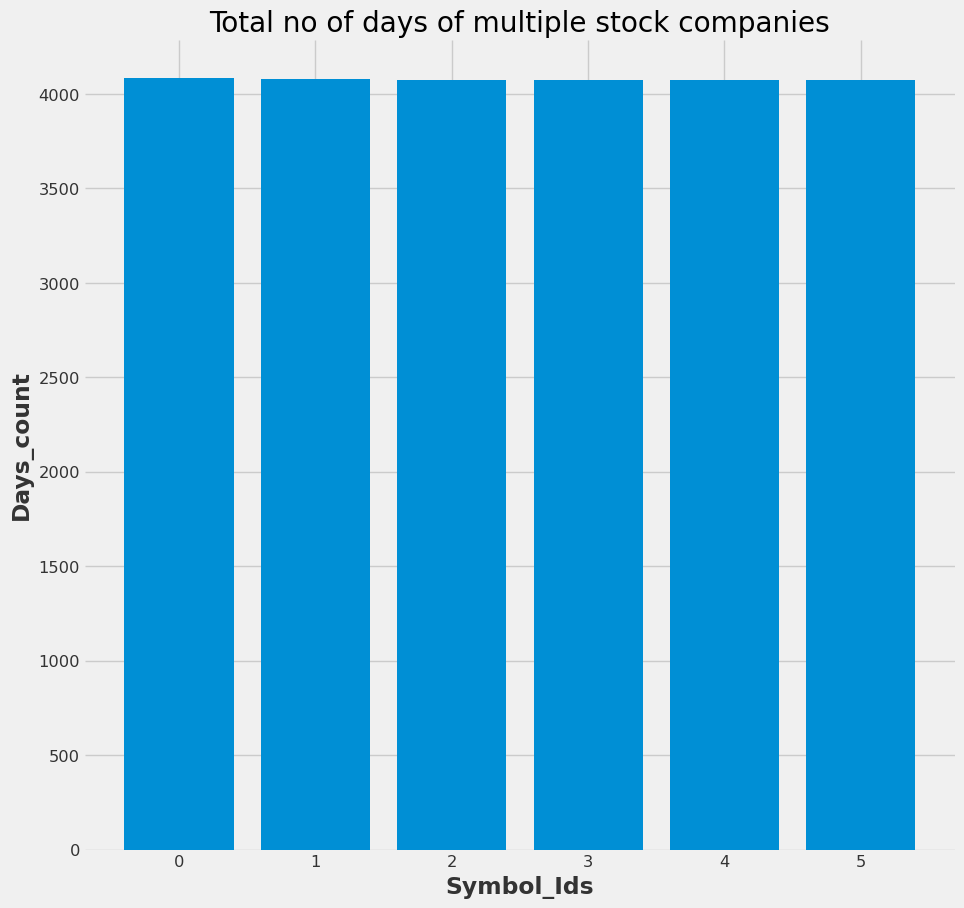

In [ ]:
import copy
all_companies_path=f'{folder_name}'

companies_dict=DataReader(all_companies_path).read_multiple_campanies()
if "KSE-100" in companies_dict:
  del companies_dict["KSE-100"]
print(f"Total Stocks: {len(companies_dict)}")
all_abbrev=list(companies_dict.keys())
print(f"All stock abbrev names: {all_abbrev})")

df,companies_dict=myutil.reduce_dataset(copy.deepcopy(companies_dict),4070)

fig = plt.figure(figsize=(10, 10))
plt.subplot(1, 1, 1)
plt.bar(df["Symbol_Ids"], df['Days_count'])
plt.xlabel('Symbol_Ids')
plt.ylabel('Days_count')
plt.title('Total no of days of multiple stock companies')


plt.show()


# **Data Cleaning and Handling Missing Values**
Some Dates were missing from the stock data so we have imputed the missing stock price data using the previous and next record and then taking average of the two prices. And for first and last row we use ffill and bfill methods

['FFC', 'NBP', 'AKBL', 'SNGP', 'BYCO', 'KEL']
KEL
Company_name:KEL, start_date: 2003-01-01 00:00:00, end_date:2019-08-30 00:00:00


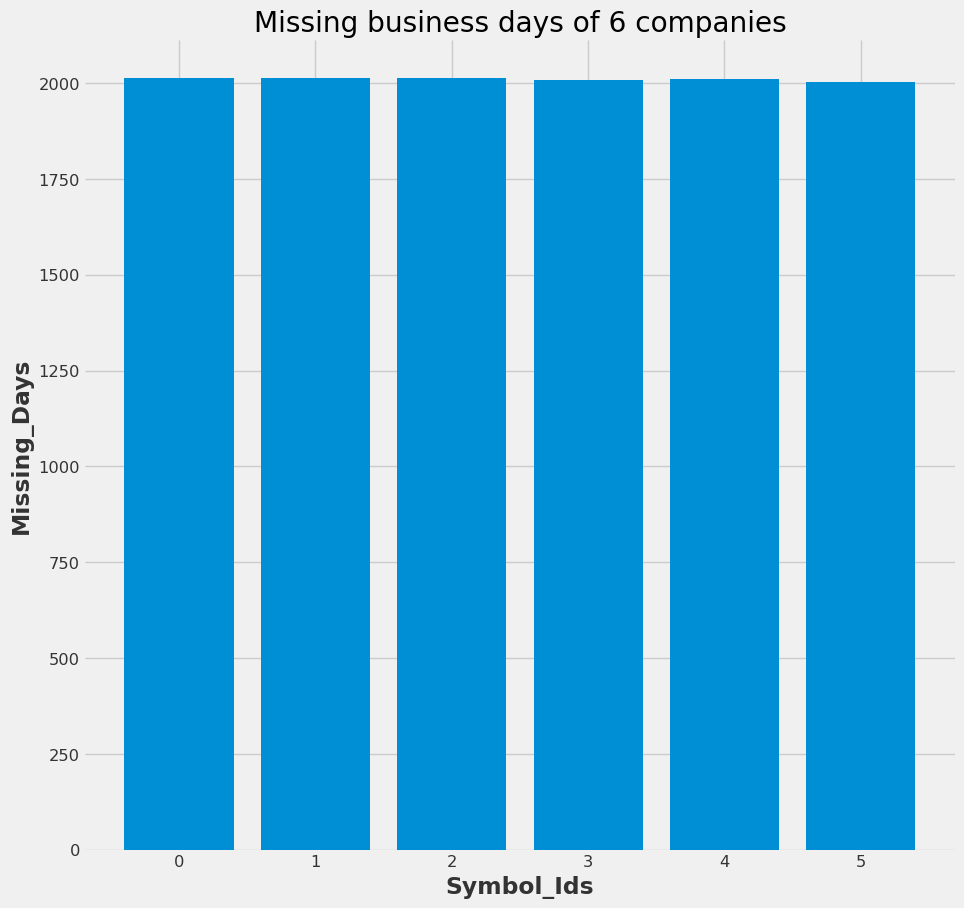


100%|██████████| 6/6 [01:10<00:00, 11.78s/it]


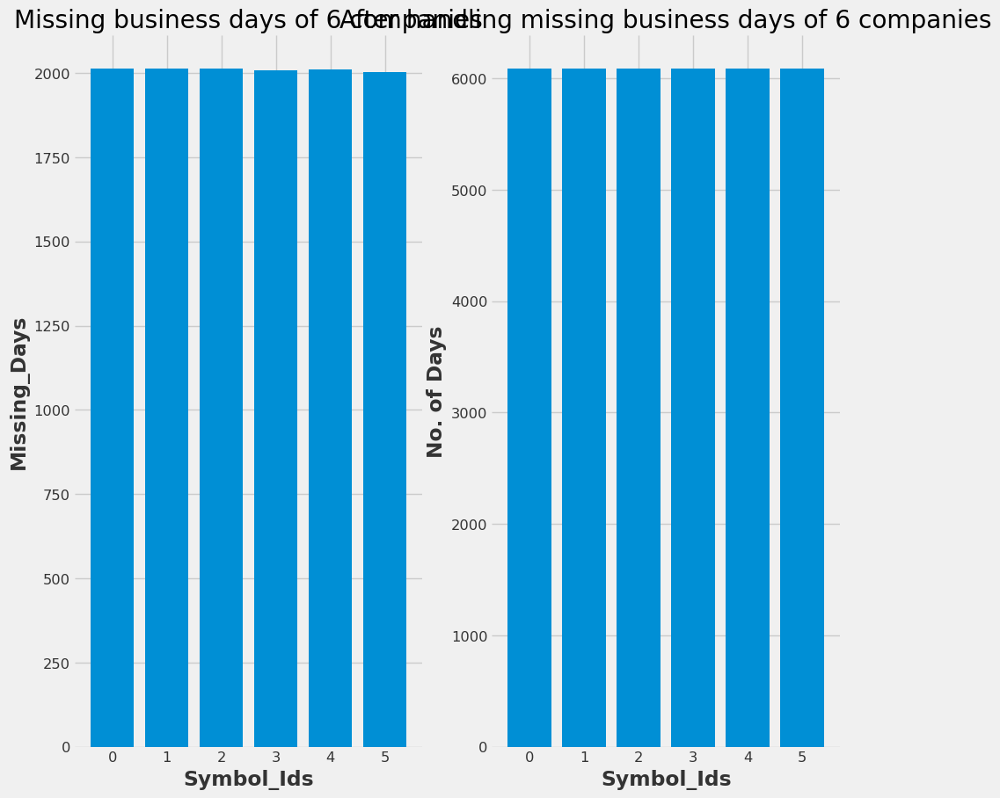

In [ ]:
#handling missing values
all_symbols=list(companies_dict.keys())
print(all_symbols)
symbol_name=all_symbols[-1]
print(symbol_name)
selected_company=companies_dict[symbol_name].index

start_date=str(selected_company[0])
end_date=str(selected_company[-1])
print(f"Company_name:{symbol_name}, start_date: {start_date}, end_date:{end_date}")
missing_days_count=myutil.count_missing_dates(start_date,end_date,companies_dict,exclude_holiday=False)
fig = plt.figure(figsize=(10, 10))
plt.bar(list(range(len(missing_days_count))), missing_days_count)
plt.xlabel('Symbol_Ids')
plt.ylabel('Missing_Days')
plt.title(f'Missing business days of {len(companies_dict)} companies')
plt.show()


companies_r=myutil.handle_missing_values(companies_dict,exclude_holiday=False)
companies=copy.deepcopy(companies_r)

#comparing after handling missing values
df_reduced,companies=myutil.reduce_dataset(companies_r,0)
#checking missing days on the dataset
complete_date_range = pd.date_range(start=start_date, end=end_date, freq='D')


# Create the first subplot
fig = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.bar(list(range(len(missing_days_count))), missing_days_count)
plt.xlabel('Symbol_Ids')
plt.ylabel('Missing_Days')
plt.title(f'Missing business days of {len(companies)} companies')


# Create the second subplot
plt.subplot(1, 2, 2)
plt.bar(df_reduced["Symbol_Ids"], df_reduced['Days_count'])
plt.xlabel('Symbol_Ids')
plt.ylabel('No. of Days')
plt.title(f'After handling missing business days of {len(companies)} companies')

plt.show()

**C)Normalization and Scaling**
  Scaling is an essential preprocessing step in machine learning, and it involves transforming the features of a dataset to be on a similar scale.
  Scaling ensures that all features contribute equally to the model training process, preventing the dominance of one feature over another.

  We have used Standard Scaling Method to scale our dataset features

  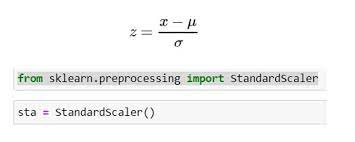


# Exploratory Data Analysis (EDA)

**Line Graph**
line graph for stock data with OHLC (Open, High, Low, Close) and Volume

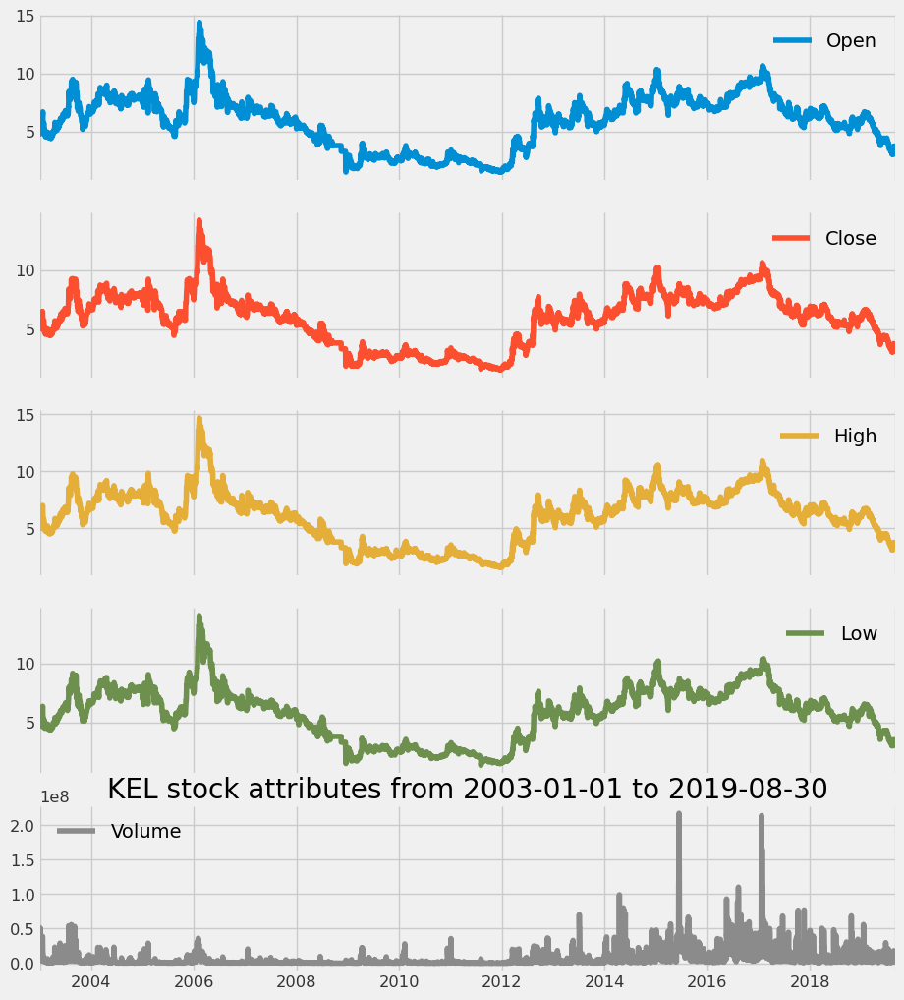

In [ ]:
visual.plot_line_graph(symbol_name,companies[symbol_name],subplots=True)

**Lag / Shift Graph of Stock Price**

A lag or shift graph in the context of stock prices involves plotting a time series against its own past values with a certain time lag. This type of graph helps visualize how the current value of a variable is related to its past values. The x-axis represents the current time, and the y-axis represents the value of the variable.

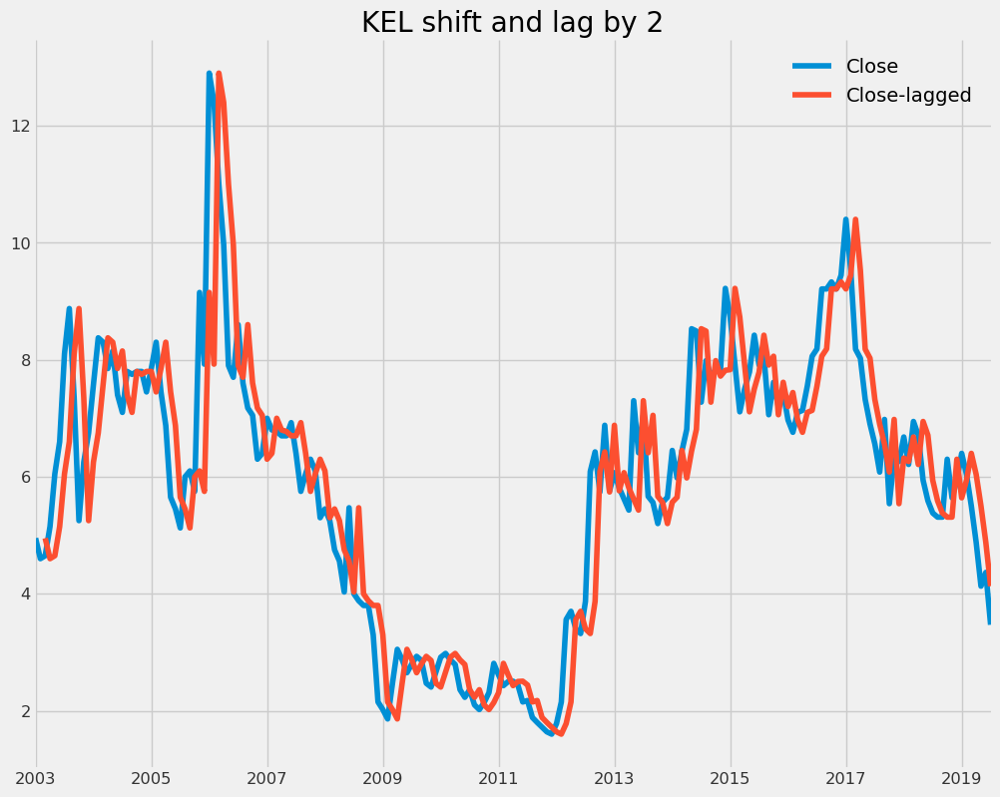

'We can shift the index by the desired number of periods with an optional time frequency. This is useful when comparing the time series with a past of itself'

In [ ]:
visual.plot_shift_and_lags(symbol_name,companies[symbol_name],columns=["Close"],subplots=False,shift=2)
"""We can shift the index by the desired number of periods with an optional time frequency. This is useful when comparing the time series with a past of itself"""

**Percentage Change of OHCL Price of Stock**
The percentage change of OHLC (Open, High, Low, Close) prices of a stock can be calculated to represent the relative price movements over a given period. The percentage change for each OHLC value is calculated as the difference between the current day's value and the previous day's value, divided by the previous day's value, and then multiplied by 100 to express it as a percentage.


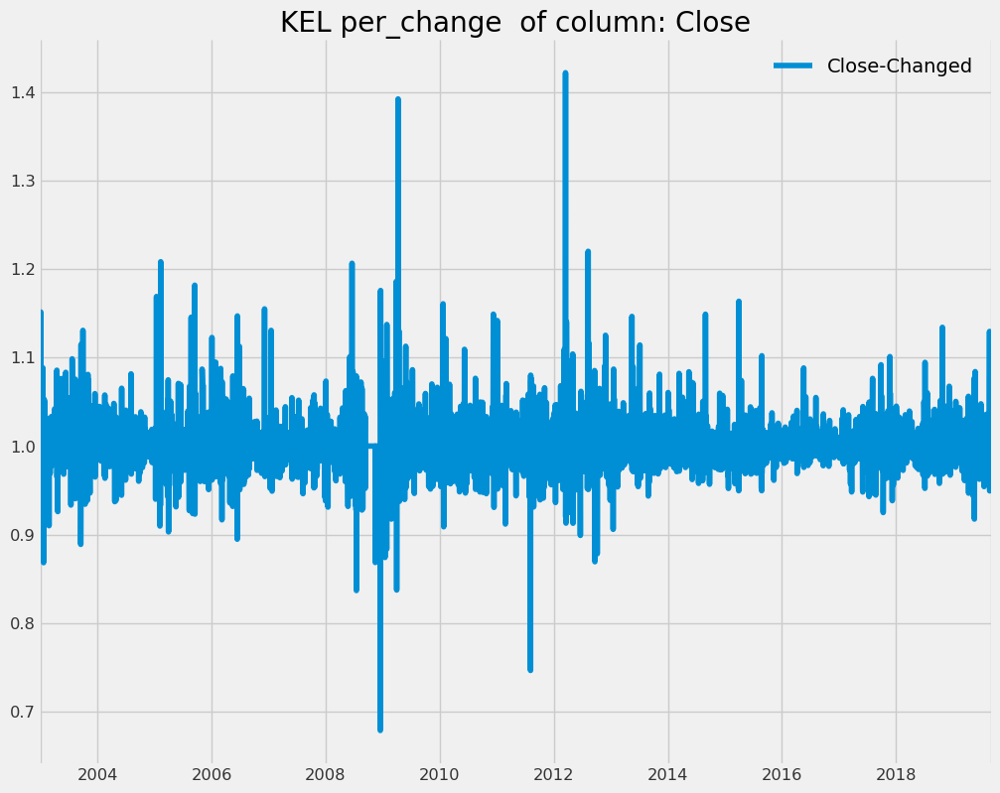

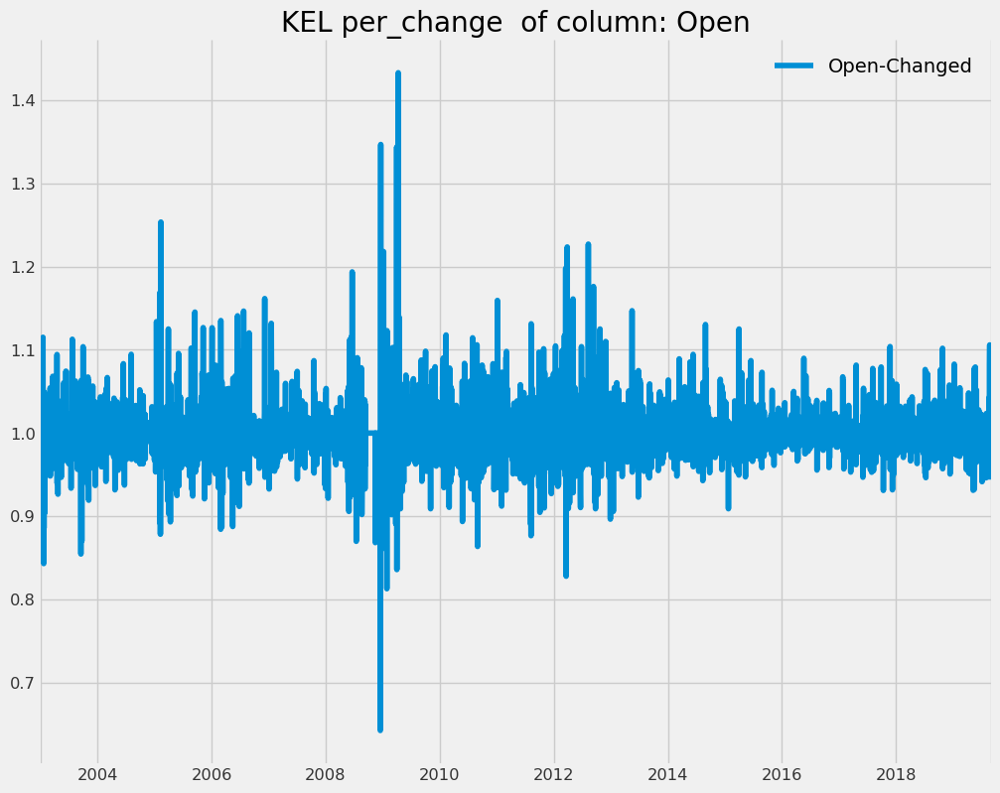

In [ ]:
visual.plot_percentage_change(symbol_name,companies[symbol_name],columns=["Close","Open"],subplots=False)

**Comparison of multiple stocks**

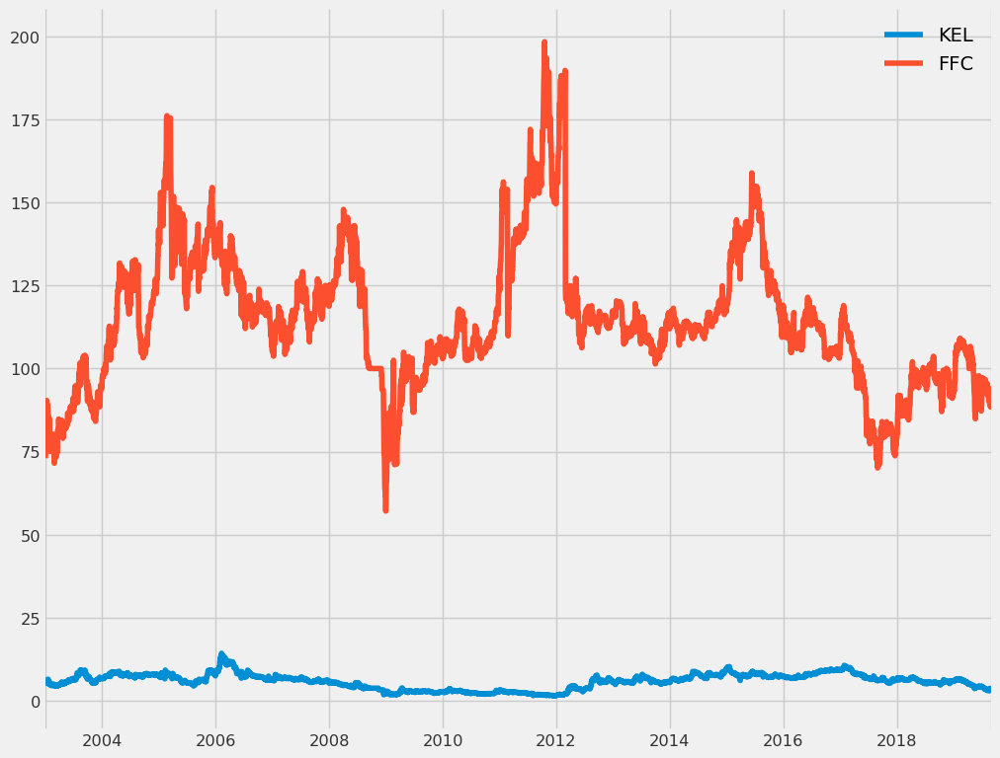

In [ ]:
visual.plot_compare_n_stocks({symbol_name:companies[symbol_name],"FFC":companies["FFC"]})

**Comparision of High Price And Rolling Mean**

The rolling mean, also known as the moving average, is a statistical calculation commonly used in time series analysis to smooth out short-term fluctuations and highlight long-term trends or cycles. In the context of stock prices, applying a rolling mean can help identify underlying trends and reduce the impact of daily or short-term price volatility.

The latest Rolling Average is obtained by multiplying the previous Rolling Average by n-1 periods, adding today's symbol price, and then dividing the total by n periods.

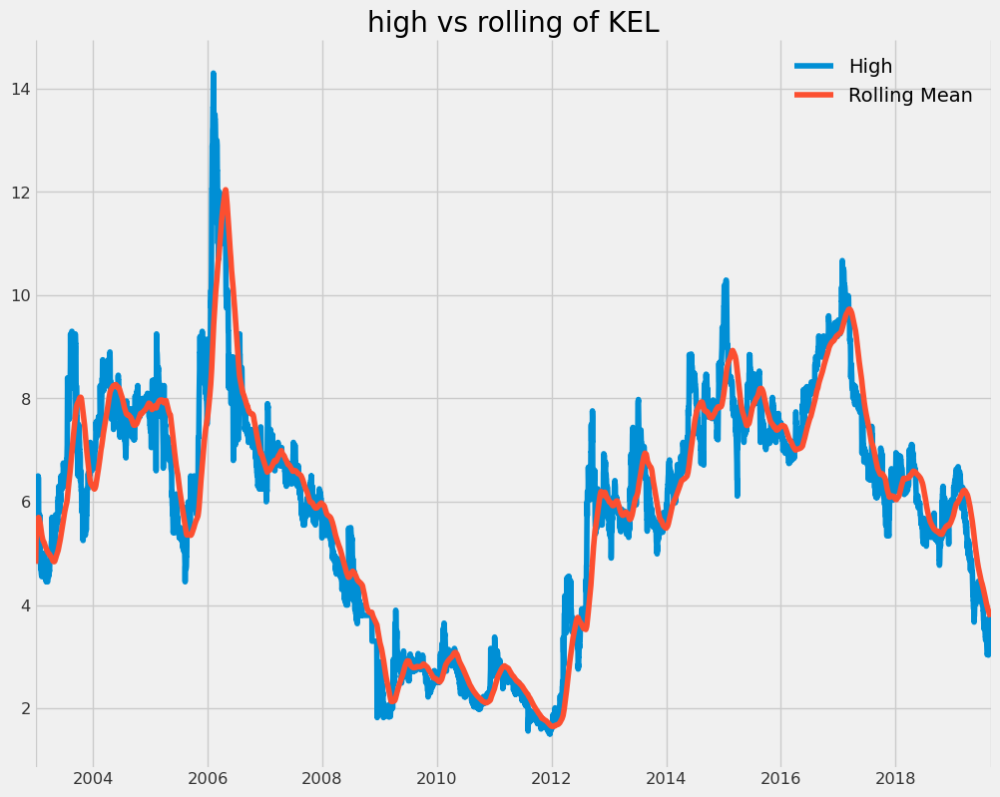

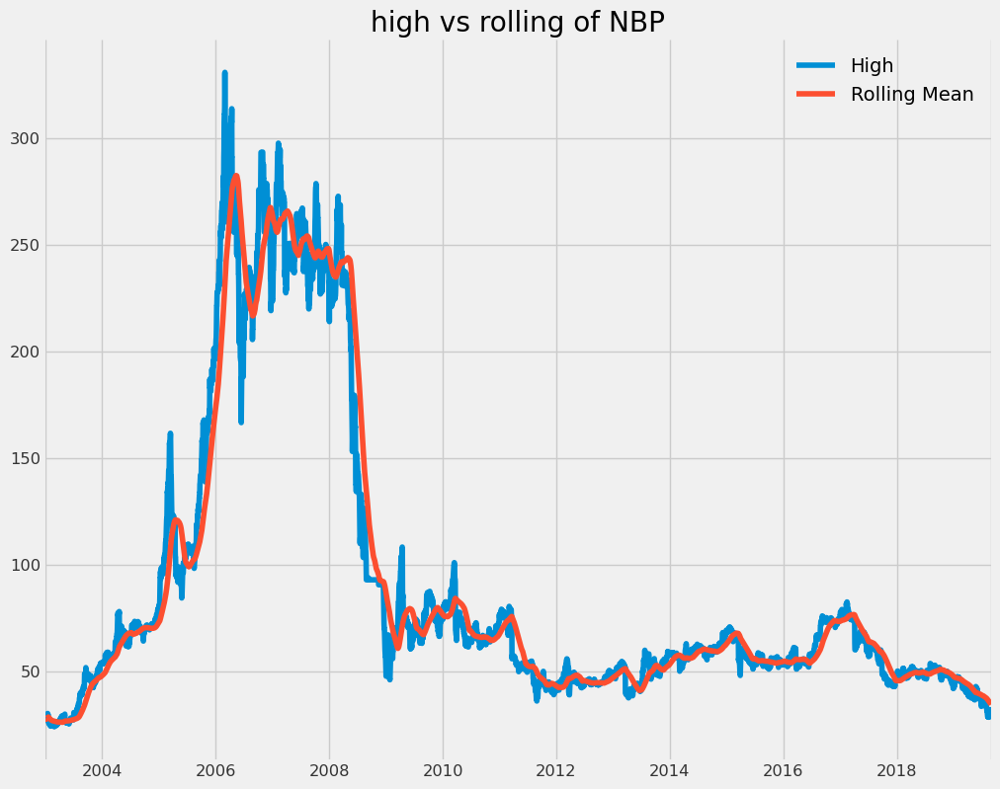

In [ ]:
visual.plot_window_function([symbol_name,"NBP"],[companies[symbol_name],companies["NBP"]])

**Random Walk in Time Series**

A random walk is a type of time series where future values are determined by the previous period's value plus a random shock. In other words, a random walk assumes that each new observation in the time series is a random step away from the previous observation. It's a simple and commonly used model for financial time series, and it has implications for forecasting and statistical analysis.

In [ ]:
visual.check_is_random_walk(companies[symbol_name])

p-value : 9.392178722218352e-09 is_random_walk=False


In [ ]:
visual.check_is_random_walk_of_n_stocks(copy.deepcopy(companies),companies.keys())

alpha confidence=0.05
stock_name: FFC p-value : 5.688378560516354e-20 is_random_walk=False
stock_name: NBP p-value : 7.740238509709835e-06 is_random_walk=False
stock_name: AKBL p-value : 1.1929876089142447e-09 is_random_walk=False
stock_name: SNGP p-value : 4.2851060963726665e-09 is_random_walk=False
stock_name: BYCO p-value : 7.3238193755094835e-09 is_random_walk=False
stock_name: KEL p-value : 9.392178722218352e-09 is_random_walk=False


**Autocorrelation** - The autocorrelation function (ACF) measures how a series is correlated with itself at different lags.Partial Autocorrelation - The partial autocorrelation function can be interpreted as a regression of the series against its past lags. The terms can be interpreted the same way as a standard linear regression, that is the contribution of a change in that particular lag while holding others constant.

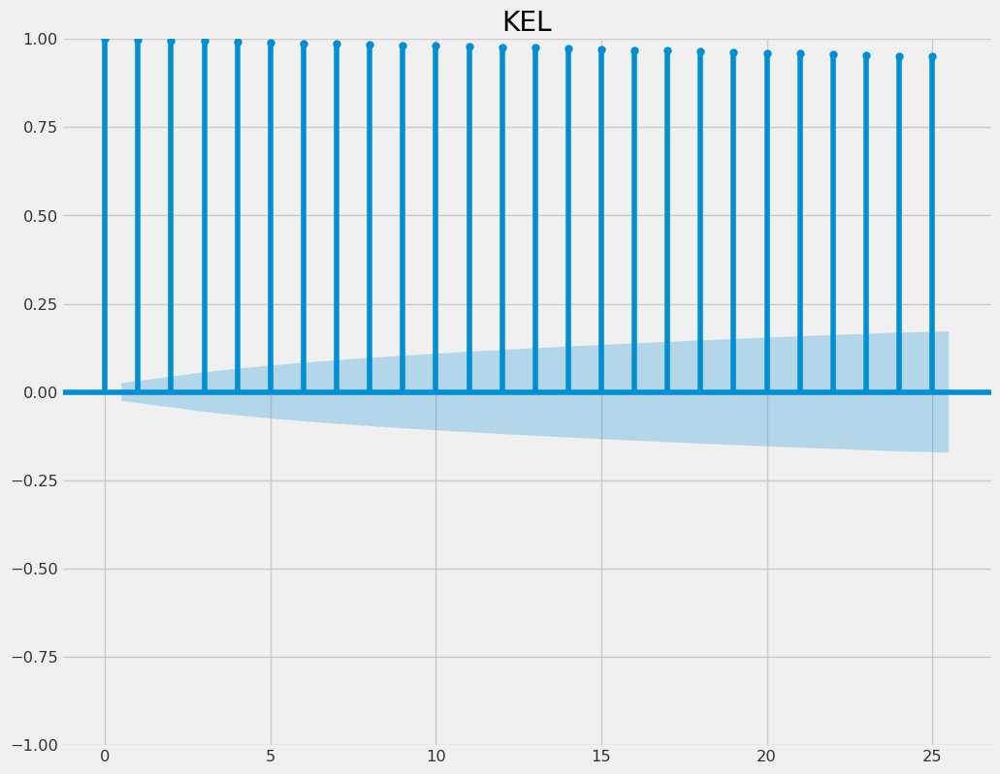

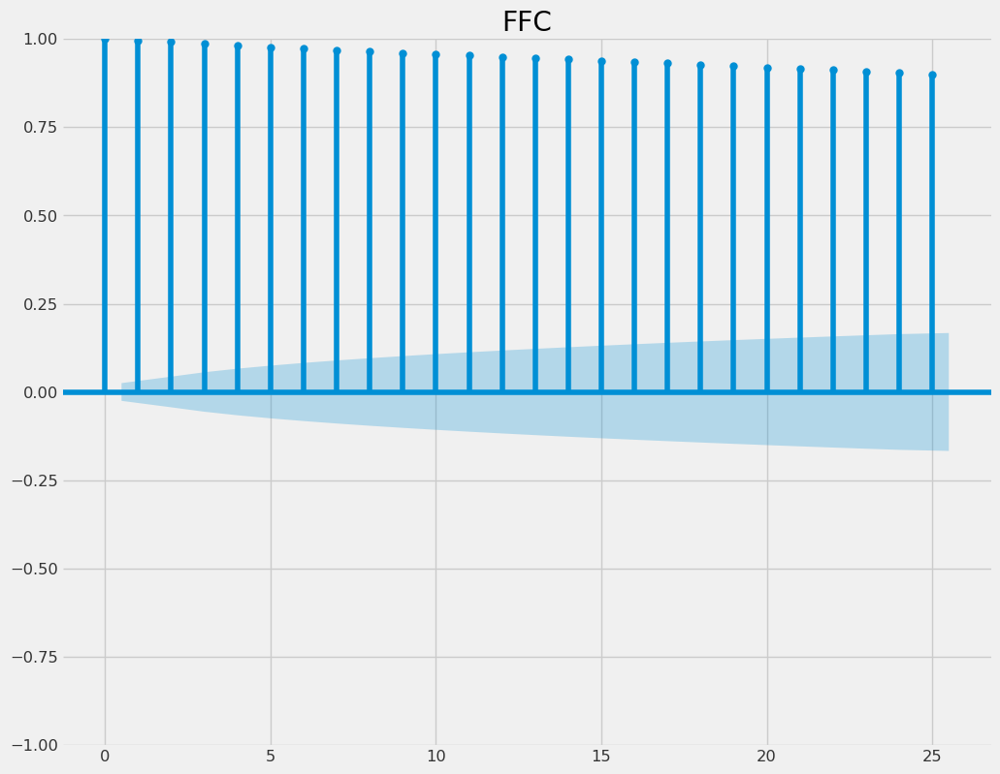

In [ ]:

visual.plot_auto_correlation({symbol_name:companies[symbol_name],"FFC":companies["FFC"]})



 The partial autocorrelation function can be interpreted as a regression
    of the series against its past lags. The terms can be interpreted the same way as a standard linear
    regression, that is the contribution of a change in that particular lag while holding others constant

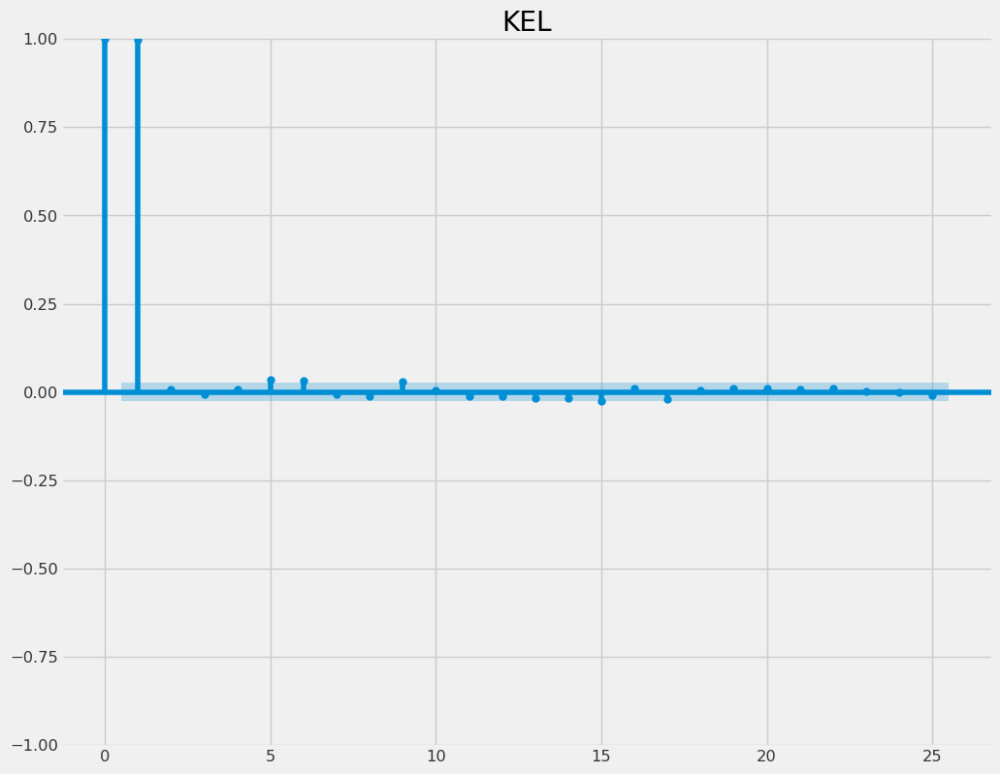

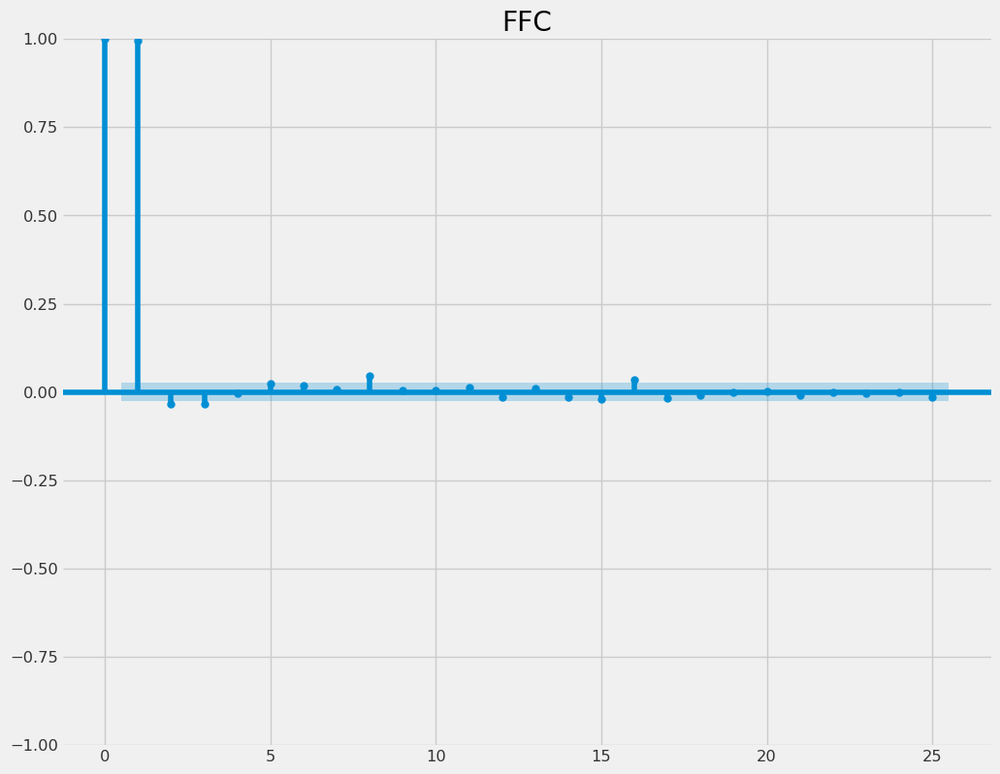

In [ ]:
visual.plot_partial_correlation({symbol_name:companies[symbol_name],"FFC":companies["FFC"]})

**Visualizing Stock Price Trends**


In [ ]:
visual.plot_line_chart(copy.deepcopy(companies))

**Seasonal Decomposition Analysis**

seasonal decomposition analysis involves breaking down a time series into its underlying components, typically including trend, seasonality, and residual (random noise). This analysis helps in understanding the underlying patterns and variations within the data. In the context of stock data, seasonality may refer to repetitive patterns or cycles that occur at regular intervals.

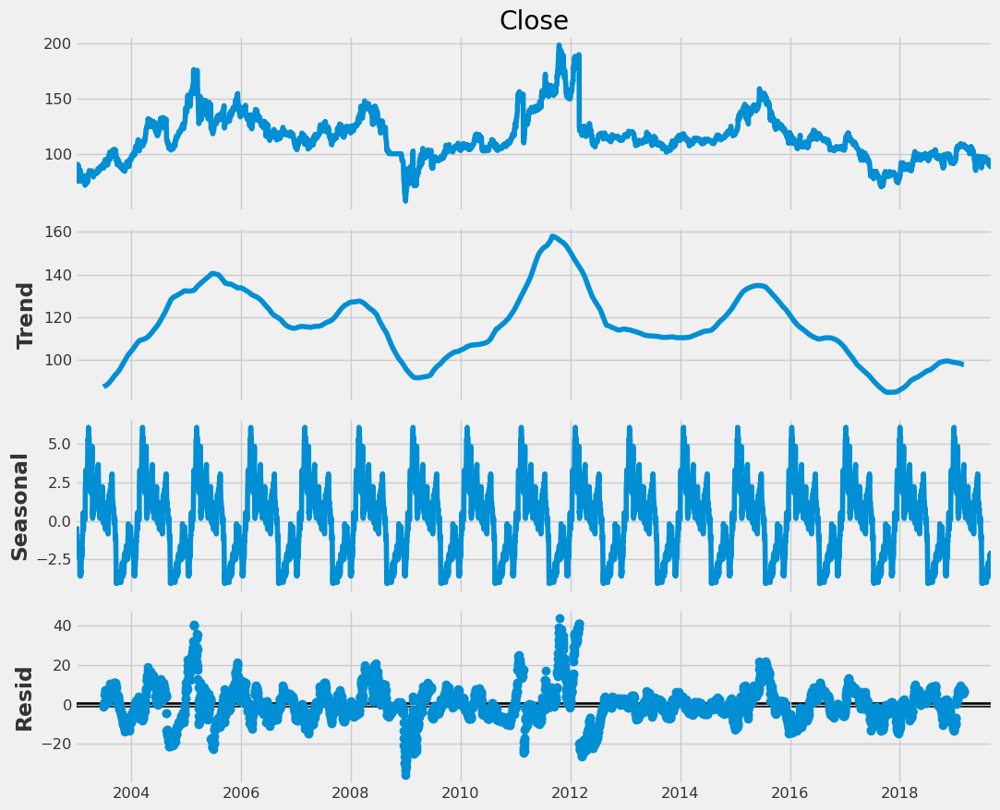

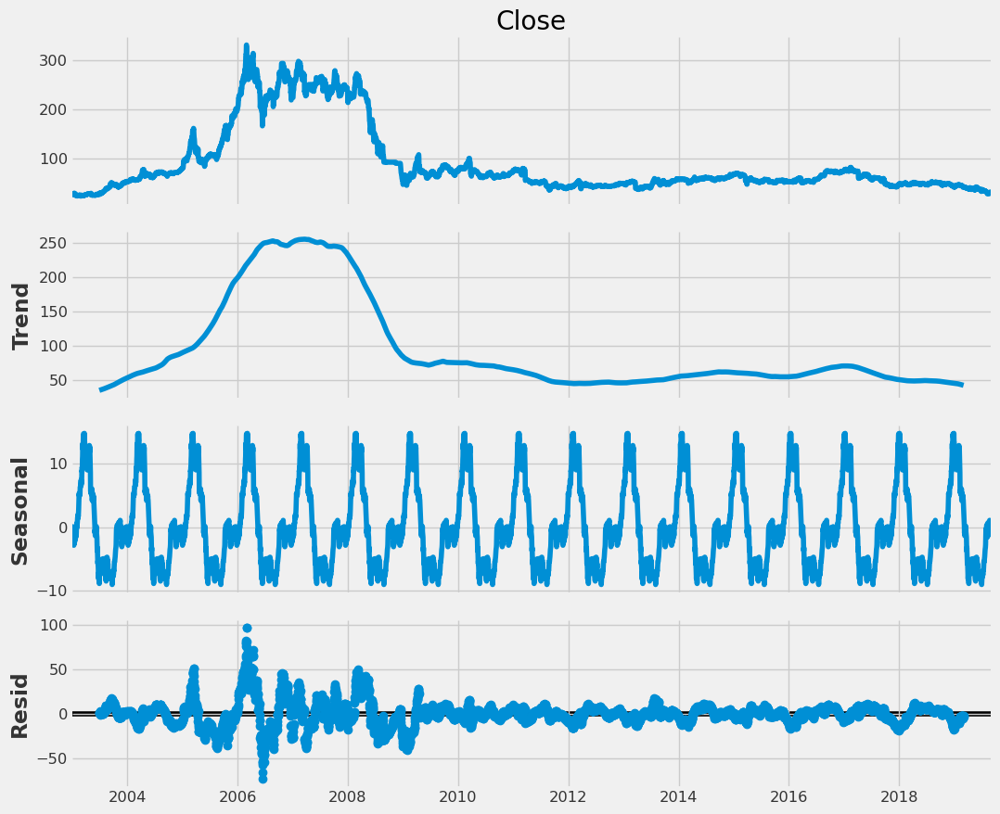

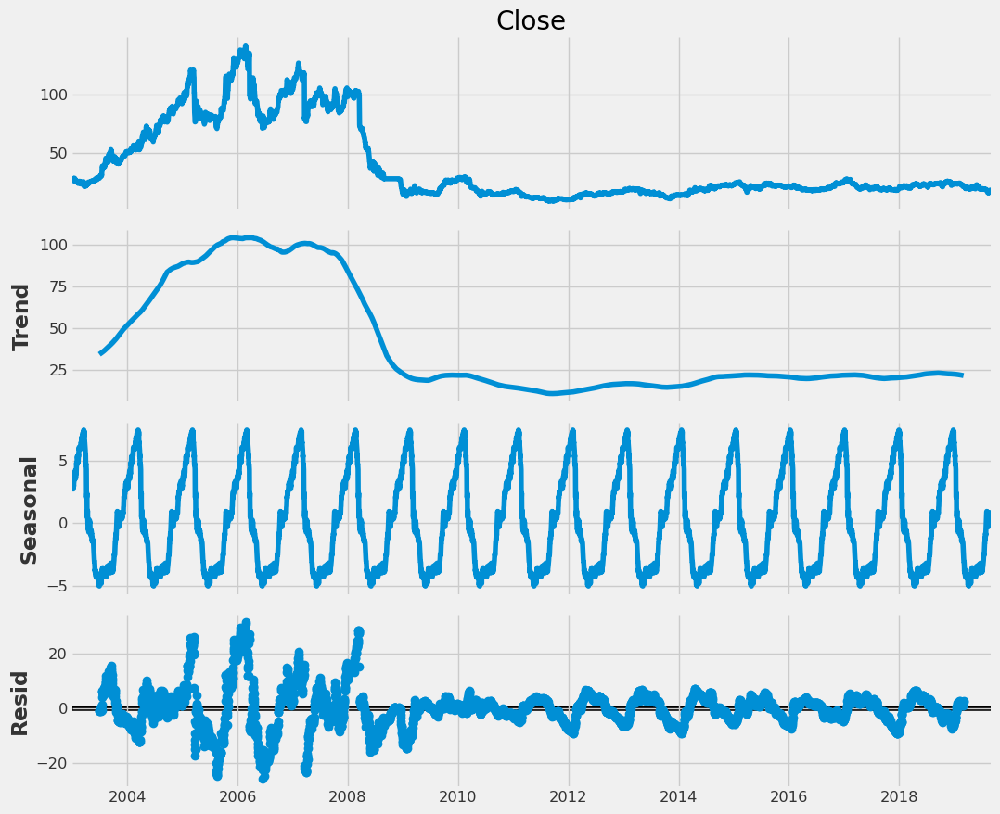

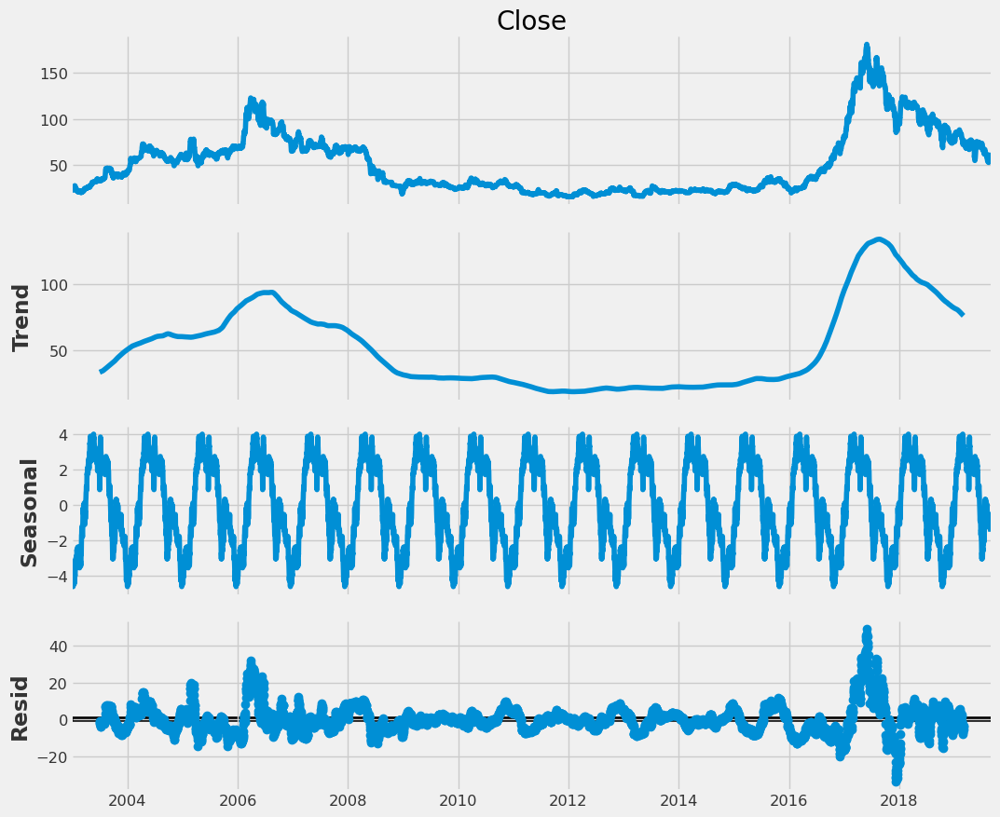

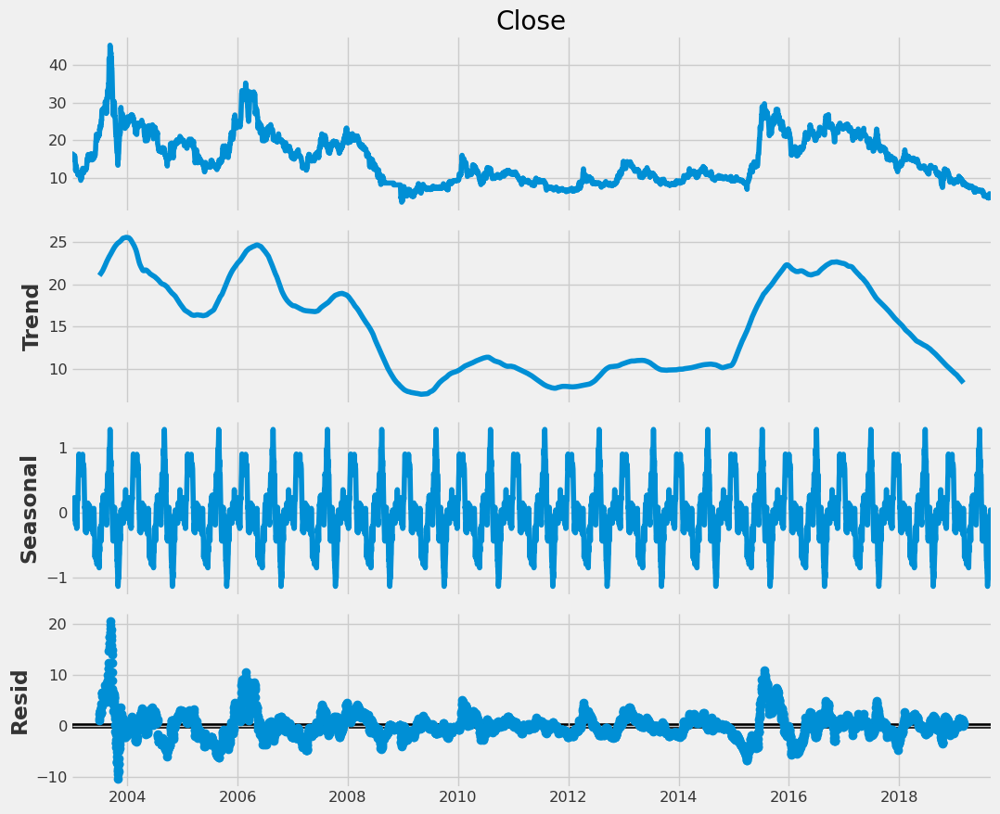

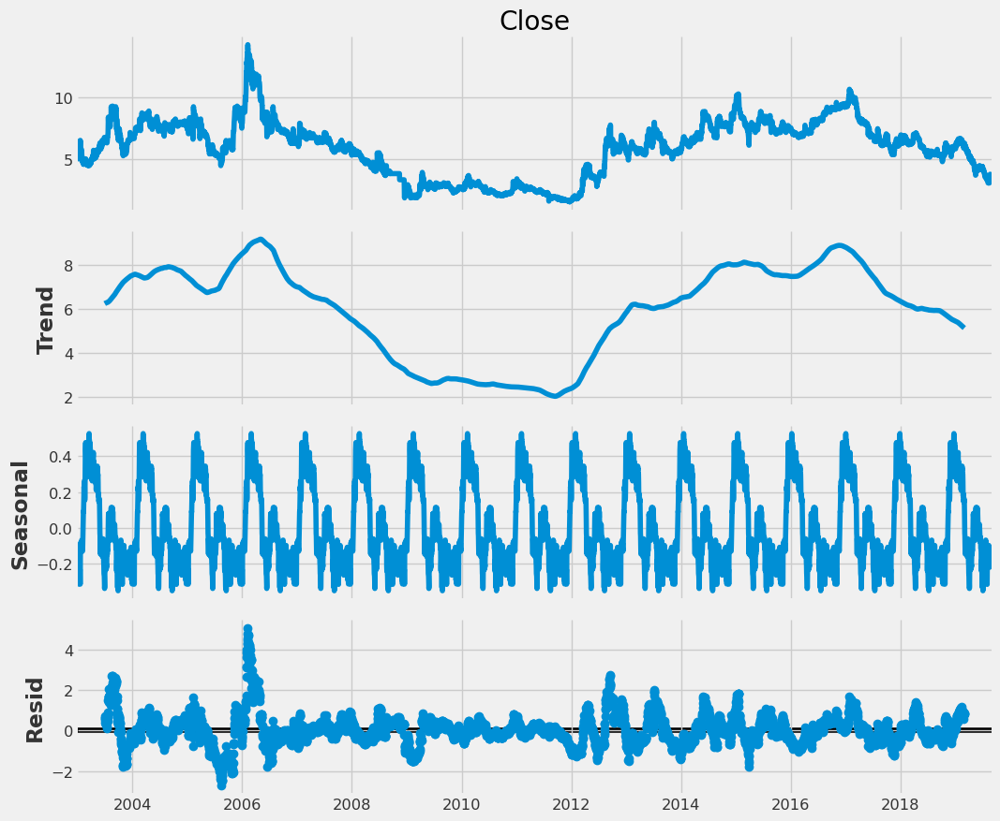

In [ ]:
visual.plot_time_series_component(copy.deepcopy(companies))

**Correlation Analysis with OHLC Components**

**Lag Plot for Autocorrelation of Companies**
A lag plot is a type of time series plot used in the analysis of time-dependent data, such as stock prices. It is designed to visualize the relationship between a variable and its lagged values (past observations). In the context of stock data, a lag plot helps explore whether there is any temporal autocorrelation or pattern in the stock prices over time.

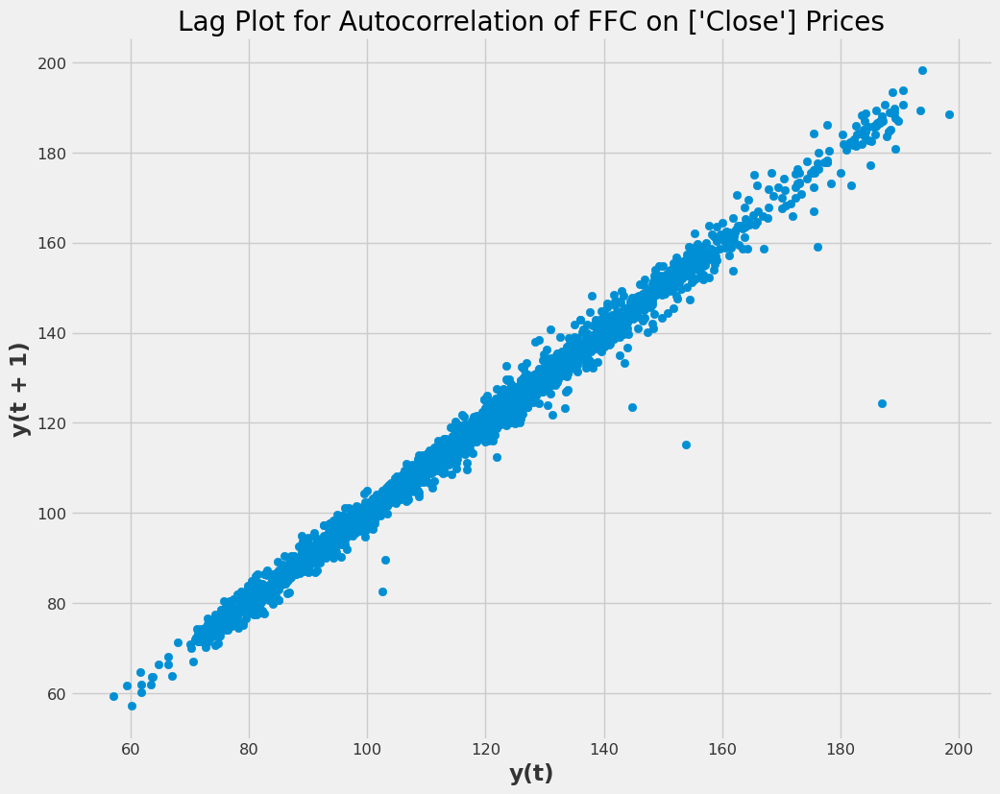

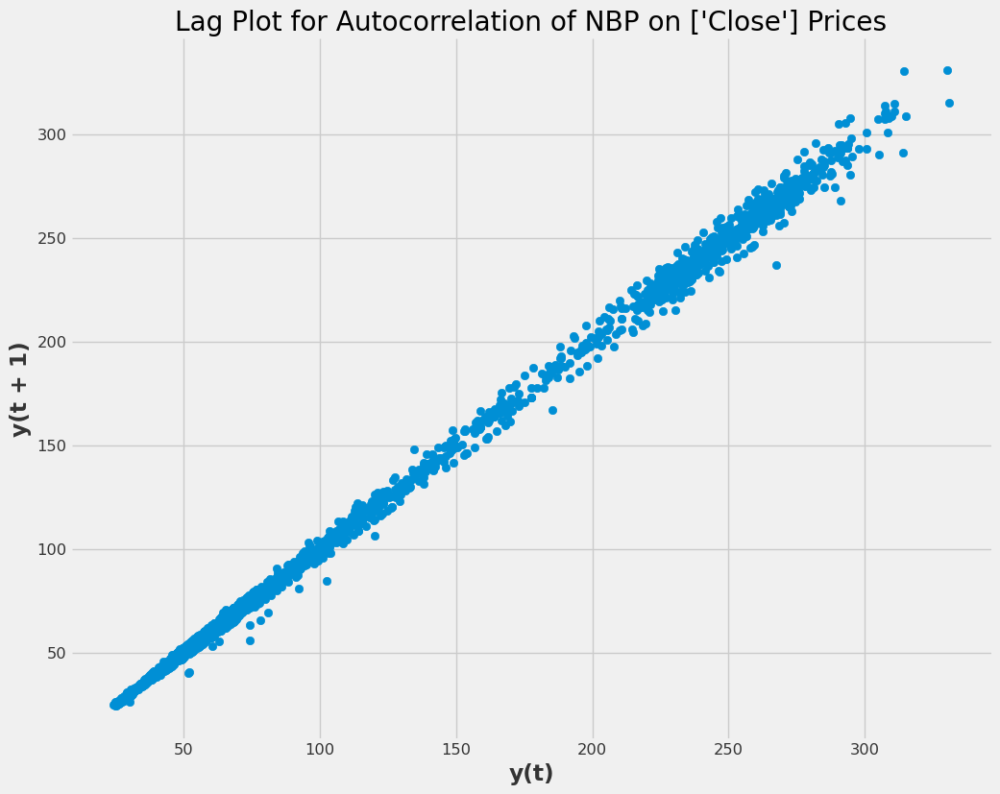

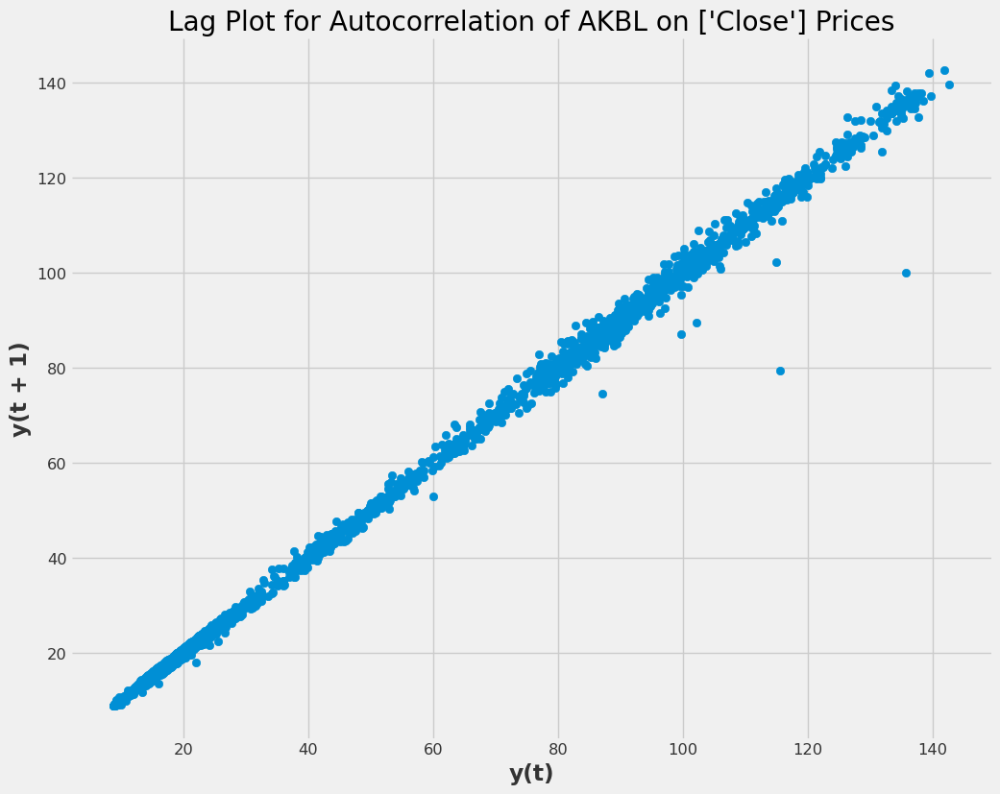

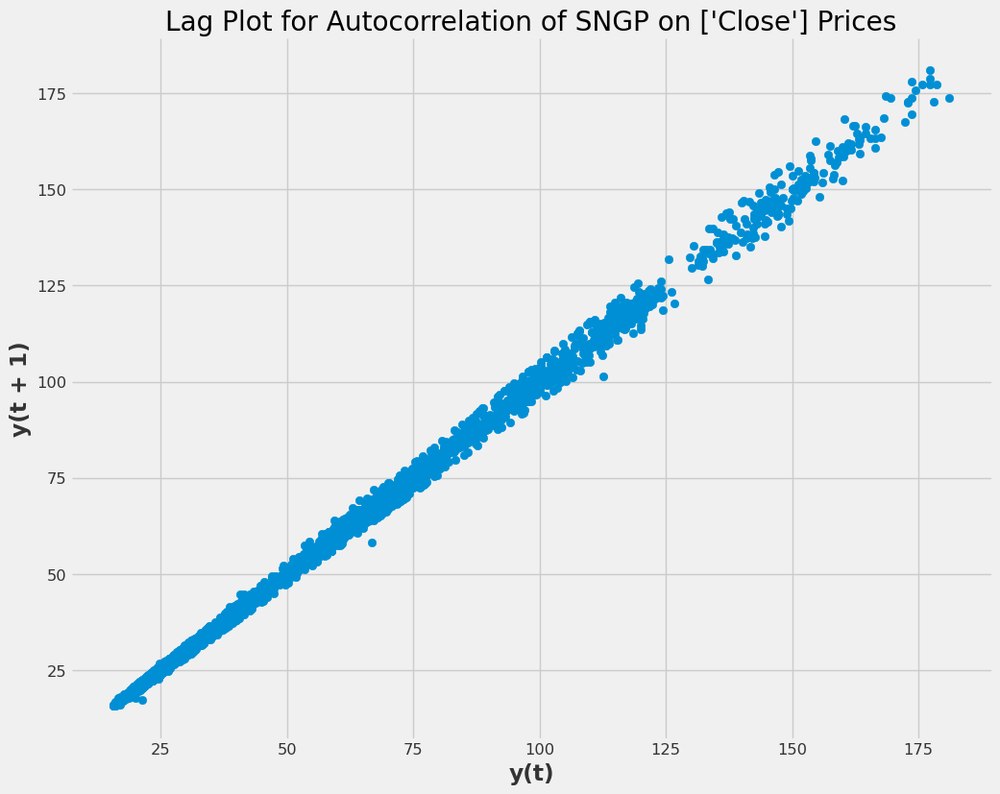

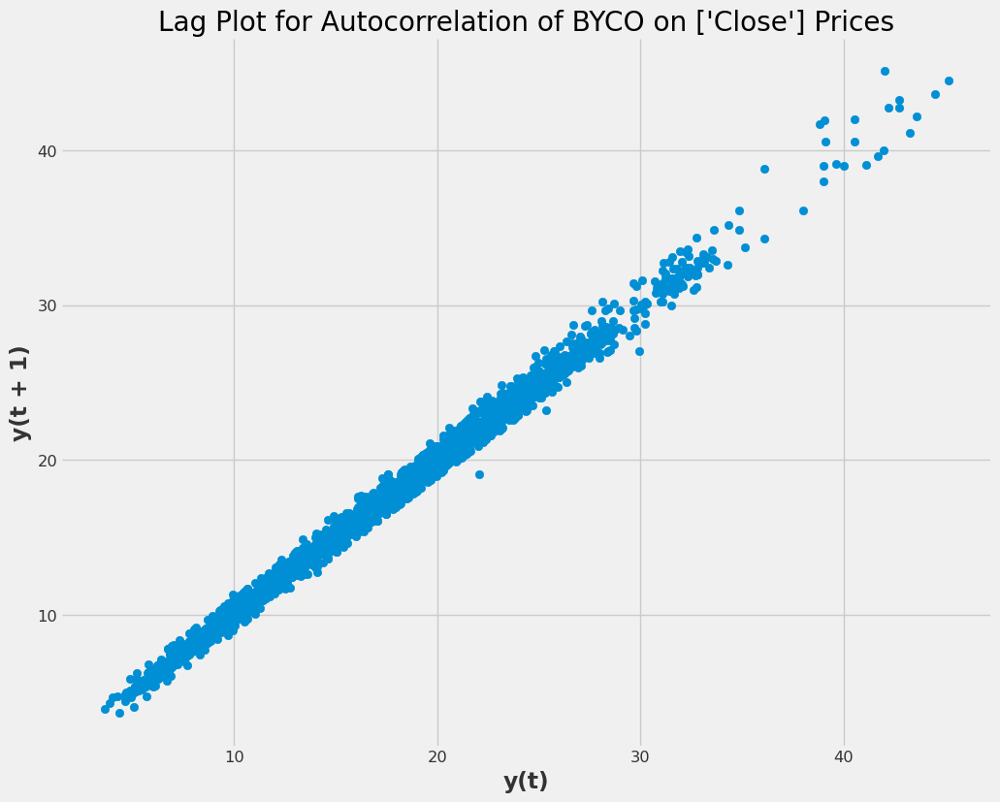

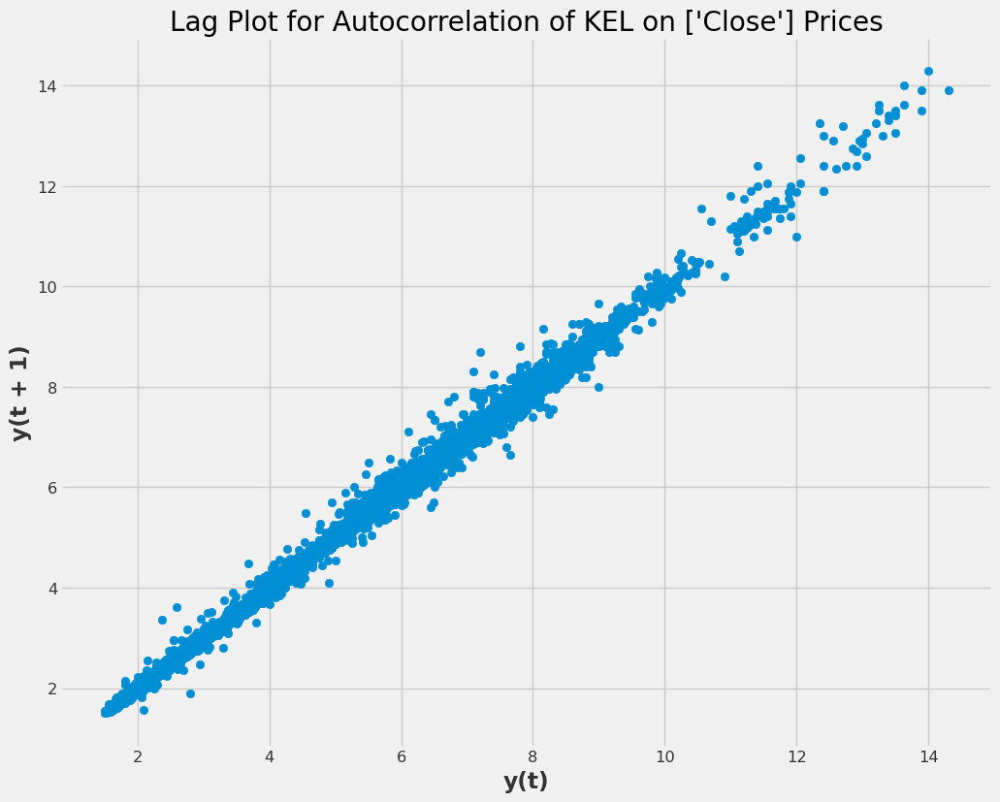

In [ ]:

visual.plot_lag(copy.deepcopy(companies),columns=["Close",],lag=1)

plot_return_analysis_graph


In [ ]:
visual.plot_return_analysis_graph(companies, list(companies.keys())[0:5])

**Historical volatility Graph**

Historical volatility, also known as realized volatility, is a measure of the dispersion of returns in the historical price of a financial instrument over a specific period. It provides insights into the level of price variability or risk associated with an asset.

Calculate the daily returns, which represent the percentage change in the stock price from one day to the next.Compute the standard deviation of the daily returns to get the historical volatility.

In [ ]:
visual.plot_historical_volatality(copy.deepcopy(companies))

plot_correlation_heat_map

In [ ]:
visual.plot_correlation_heat_map(companies,list(companies.keys())[0:10])

#**Questions**

Q) How to compute the Value at Risk (VaR) for the Company’s A stock at a 95% confidence level based on the historical daily using hypothesis testing method?

Value at Risk (VaR) is a statistical measure that represents the maximum loss that an investment portfolio or a stock can incur within a given time frame at a specified confidence level

The VAR of TELE, DCL, NRSL, PIAA, JSCL is high which there is high chance of loss in these stock prices

VaR at 95% confidence level: 

{'FFC': -0.023139727926261483, 'NBP': -0.02914523847103651, 'AKBL': -0.02993055887836423, 'SNGP': -0.030160785299947295, 'BYCO': -0.03979728576842891, 'KEL': -0.04340391096387005}


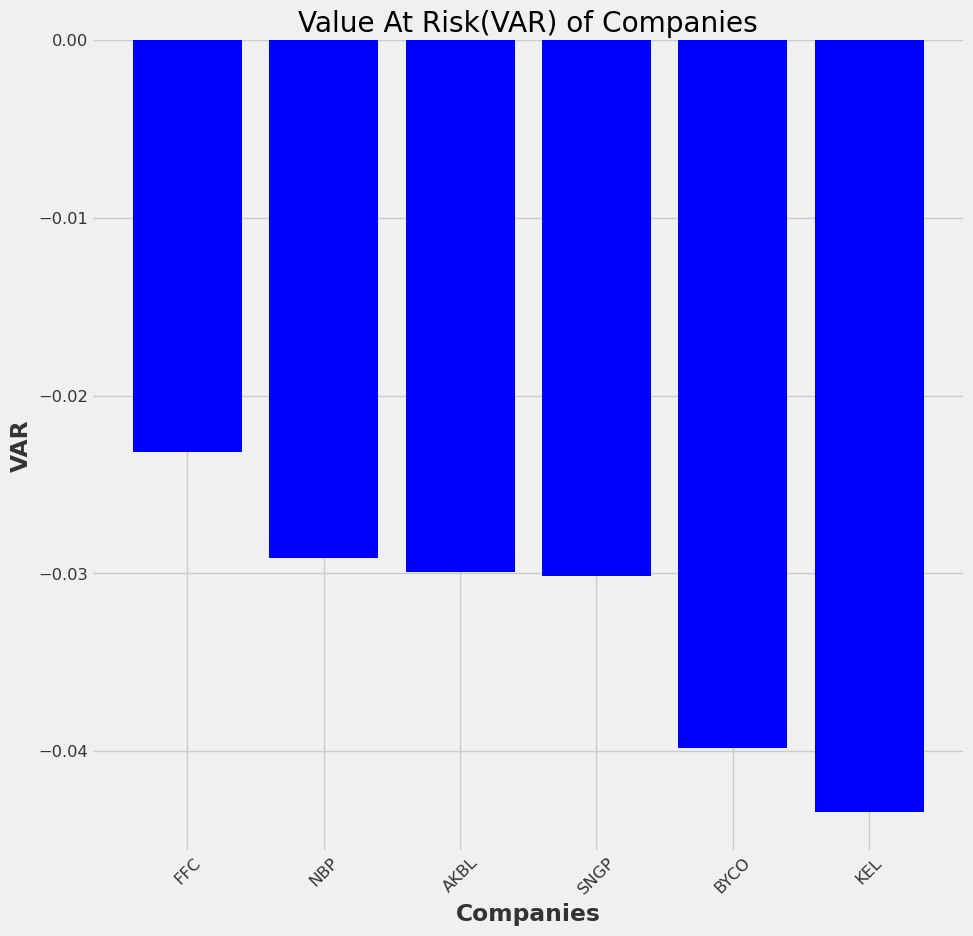

In [ ]:

import copy
def compute_var(companies, confidence_level=0.95):
  import numpy as np
  import pandas as pd
  from scipy.stats import norm
  '''
  The function compute_var calculates the mean and standard deviation of returns and then computes VaR
  using the inverse of the cumulative distribution function (CDF) of the normal distribution.
  '''

  val_at_risk_companies = {}

  for key, value in companies.items():
    companies[key]['Daily Returns'] =  companies[key]['Close'].pct_change().fillna(0)

    mean_return = np.mean(companies[key]['Daily Returns'])
    std_dev_return = np.std(companies[key]['Daily Returns'])

    # Calculate VaR using the inverse of the cumulative distribution function (CDF) of the normal distribution
    z_score = norm.ppf(1 - confidence_level)
    val_at_risk_companies[key] = mean_return + (z_score * std_dev_return)


  return val_at_risk_companies


def plot_VAR(companies, companiesToShow=30):

  plt.figure(figsize =(10, 10))
  plt.bar(list(companies.keys())[: companiesToShow], list(companies.values())[:companiesToShow], color='blue')
  plt.xlabel('Companies')
  plt.ylabel('VAR')
  plt.xticks(rotation=45)
  plt.title('Value At Risk(VAR) of Companies')

  # Display the chart
  plt.show()



# Compute VaR at a 95% confidence level
var_95 = compute_var(copy.deepcopy(companies_dict), confidence_level=0.95)
print("VaR at 95% confidence level: \n")
print(var_95)
plot_VAR(var_95)


Q) What is the average true range (ATR) of the stock over the 10-year period and also its maximum and minimum ATR of over the past 10 years?

A)
ATR Indicator: ATR measures market volatility by considering the range between the high and low prices. A lower ATR value suggests lower volatility and potentially greater stability.

Average ATR: Gives you a sense of the typical volatility in the market during the specified period. A higher average ATR indicates higher volatility.

Maximum ATR: Indicates the maximum expected price movement on any given day. This value helps you understand the potential for extreme market volatility.

Minimum ATR: Represents the lowest expected price movement on any given day. This value helps you understand the potential for minimal market volatility.

So we have plotted the Average, Max, Min ATR of companies which indicates the stability and volatility of the stock prices.


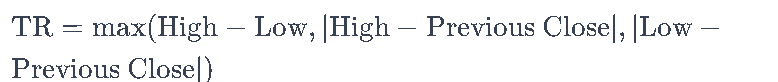

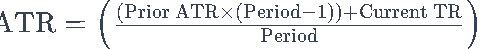



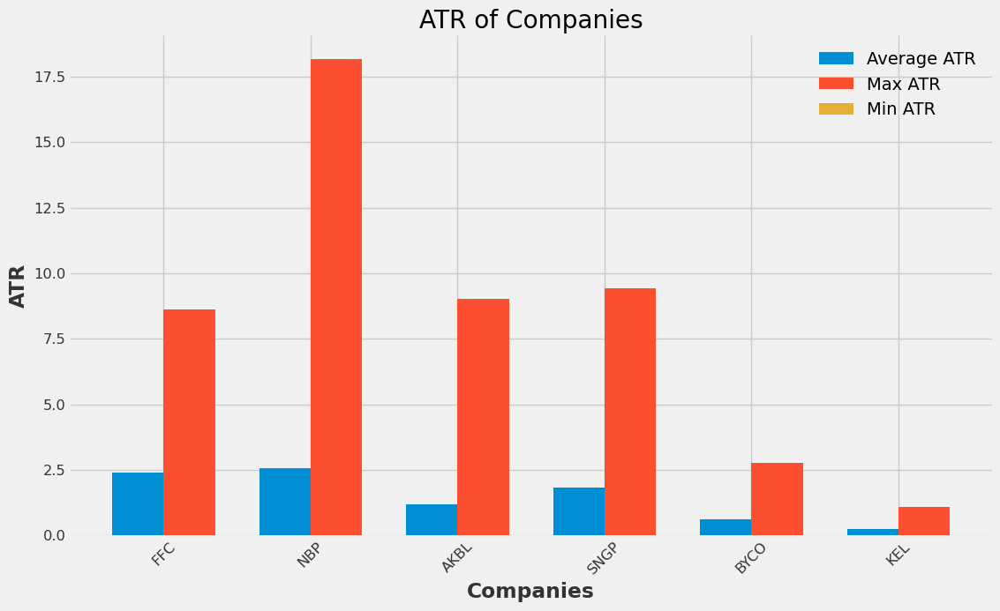

In [ ]:

import copy

visualize = Visualization()
companies_atr = visualize.cal_ATR(copy.deepcopy(companies_dict))
visualize.plot_ATR_of_comapanies(companies_atr, companiesToShow=30)


Q)Which are the top 3 stable companies, 3 unstable companies, and 3 average companies?.

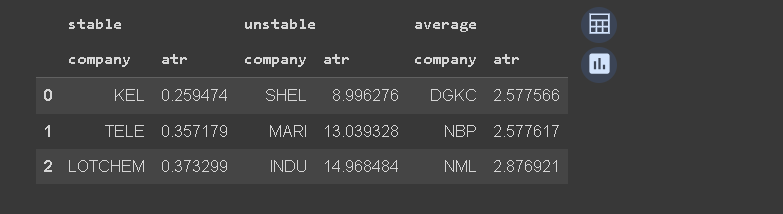

In [ ]:
import pandas as pd

visualize = Visualization()
companies_atr = visualize.cal_ATR(copy.deepcopy(companies_dict))
topStableUnStableAvgATR = visualize.top_N_Stable_Unstable_Avg_Stock_Using_ATR(companies_atr, top=3)

topStableUnStableAvgATR = pd.concat(topStableUnStableAvgATR, axis=1)
topStableUnStableAvgATR


stable           unstable           average          
  company       atr  company       atr company       atr
0     KEL  0.259474     SNGP  1.825952    BYCO  0.604770
1    BYCO  0.604770      FFC  2.396453    AKBL  1.186368
2    AKBL  1.186368      NBP  2.577617    SNGP  1.825952

Q)What is the probability that the open price is greater than the close price on any T+1 day?

In [ ]:
import pandas as pd

visualize = Visualization()

prob_of_open_greater_than_close_price_of_companies =  visualize.probability_of_open_greater_than_close(copy.deepcopy(companies_dict))
print(f"{prob_of_open_greater_than_close_price_of_companies[prob_of_open_greater_than_close_price_of_companies['probability of open price greater than close price'] == prob_of_open_greater_than_close_price_of_companies['probability of open price greater than close price'].max()].iloc[0]['Company']} Company has highest probability of Open > Close: {prob_of_open_greater_than_close_price_of_companies['probability of open price greater than close price'].max():.2%}\n\n")
prob_of_open_greater_than_close_price_of_companies.head(50)

BYCO Company has highest probability of Open > Close: 60.81%




,Company,probability of open price greater than close price
0,FFC,0.526947
1,NBP,0.526454
2,AKBL,0.509366
3,SNGP,0.549293
4,BYCO,0.608117
5,KEL,0.583306


QDetermine the correlation between the closing prices of 2 rivalry companies over the last six months.

Rival companies often operate within the same industry, and the entire industry may experience positive trends or conditions. If there's a broad market trend or positive economic conditions that benefit the industry as a whole, the stock prices of multiple companies within that sector may rise concurrently.

NBP and AKBL both are banks in the correlation matrix and both are highly and positively correlated.


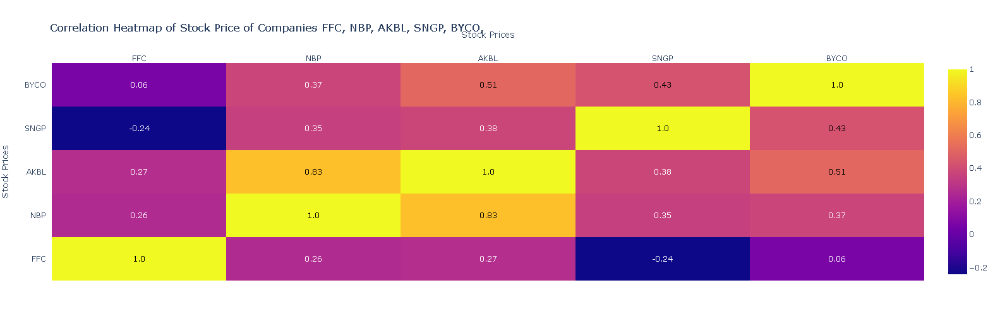

In [ ]:
visualize.plot_correlation_heat_map(companies,list(companies.keys())[0:10])

Q) Assess relationship between the OHLC variables OHLC (open, high, low, close) using  Pearson correlation

It is observed that open, close , high, low prices for every stock is very high positively correlated. if one of them is increasing then other three variables are also increasing

In [ ]:

import copy

visualize = Visualization()
print("Correlation Matrix of OHCL Data of Stocks:\n\n")
visualize.corr_between_ohcl_data(copy.deepcopy(companies_dict), 20)


Correlation Matrix of OHCL Data of Stocks:




In [ ]:
"""hierarchical Cluster Analysis: Applying hierarchical  clustering techniques to group companies with
similar stock price behaviors using dynamic wrapping time.
"""
#visual.plot_dendogram_to_check_similarity_between_stock(copy.deepcopy(companies),companies.keys(),"Close")


"""hierarchical Cluster Analysis: Applying hierarchical  clustering techniques to group companies with similar stock price behaviors using dynamic wrapping time.
"""
#visual.plot_dendogram_to_check_similarity_between_Features(companies["FFC"],"FFC",columns=["Close","Open","Low","High","Volume"])

'hierarchical Cluster Analysis: Applying hierarchical  clustering techniques to group companies with similar stock price behaviors using dynamic wrapping time.\n'

In [ ]:
"""Separate the n stocks movement into seasonality, linearly, and uncertainty? benefits and why we use it."""
#visual.plot_time_series_decomposition(copy.deepcopy(companies),)
#visual.plot_time_series_decomposition(copy.deepcopy(companies),"multiplicative")

'Separate the n stocks movement into seasonality, linearly, and uncertainty? benefits and why we use it.'

In [ ]:
"""How many times did company A experience a gap up or a gap down in the last 10 years?"""
#visual.plot_up_down_count(companies["FFC"],"FFC",no_of_year=1)
#visual.plot_up_down_count_for_multiple_stocks(copy.deepcopy(companies_r),companies_r.keys(),1)


'How many times did company A experience a gap up or a gap down in the last 10 years?'

In [ ]:
#visual.check_is_random_walk_of_n_stocks(companies,companies.keys(),column="Close")

"""
QHow hypothesis testing done is done on stocks data? using multiple companies to check stionarity?

A random walk is a mathematical object, known as a stochastic or random process,
    that describes a path that consists of a succession of random steps on some mathematical space such as the integers.
    In general if we talk about stocks, Today's Price = Yesterday's Price + Noise
    Augmented Dickey-Fuller test
    An augmented Dickey–Fuller test (ADF) tests the null hypothesis that a unit root is present in a time series sample.
    It is basically Dickey-Fuller test with more lagged changes on RHS.




The Augmented Dickey-Fuller (ADF) test is a statistical test commonly used to determine whether a given time series is stationary.
In the context of a random walk, the ADF test is applied to test the null hypothesis that a unit root is present in the autoregressive (AR) process of the time series.

Here's how the ADF test works in the context of a random walk:

Null Hypothesis (H0): The null hypothesis of the ADF test is that the time series has a unit root
, which implies that it is non-stationary. In the context of a random walk, having a unit root means that the series has a stochastic trend and its behavior is essentially random.

Alternative Hypothesis (H1): The alternative hypothesis is that the time series is stationary.
 Rejection of the null hypothesis suggests that the time series is stationary and does not have a unit root.

Test Statistic: The ADF test computes a test statistic that compares the presence of a unit root in the autoregressive process.
The test statistic is compared to critical values to determine whether to reject the null hypothesis.

Critical Values: The critical values depend on the chosen significance level and the length of the time series.
They are used to compare with the test statistic. If the test statistic is less than the critical value, the null hypothesis is rejected.

In the case of a random walk:

If the ADF test fails to reject the null hypothesis (H0): It suggests that the time series has a unit root and is non-stationary.
This aligns with the characteristics of a random walk, where the series exhibits a stochastic trend.

If the ADF test rejects the null hypothesis (H0): It suggests that the time series is stationary,
 indicating that it does not have a unit root. This contradicts the characteristics of a random walk.

The ADF test is often applied to financial time series, such as stock prices, to assess their stationarity.
If the test fails to reject the null hypothesis, it implies that the series follows a random walk, where future prices are not predictable based on past prices.
However, it's important to note that a rejection of the null hypothesis doesn't necessarily mean that the series is predictable, as other non-stationary processes might still be present.
====benefits===
Easier Modeling: Stationary time series tend to exhibit consistent statistical properties over time, making them easier to model.
The parameters of statistical models (such as ARIMA, GARCH, etc.) are more likely to be stable and interpretable when applied to stationary data.

Mean and Variance Stability: In a stationary time series, the mean and variance of the data remain relatively constant over time.
 This stability simplifies the modeling process and allows for more reliable forecasts. Non-stationary series may exhibit changing means or variances,
 making it challenging to make accurate predictions.

Statistical Tests are Valid: Many statistical tests and techniques assume or work best with stationary data. For example,
the Augmented Dickey-Fuller test,
used to test for stationarity, requires the time series to be stationary under the null hypothesis.

Improved Forecasting: Stationary time series often exhibit more predictable patterns, making forecasting more reliable.
Models trained on stationary data are likely to provide better out-of-sample predictions compared to models trained on non-stationary data.

Elimination of Spurious Relationships: In non-stationary time series, v
ariables may be correlated due to trends or other time-varying patterns rather than true relationships.
Stationarizing the series can help in identifying genuine relationships and avoiding spurious correlations.

Easier Interpretation: Stationary time series make it easier to interpret the behavior of the underlying process. T
rends, seasonality, and other patterns are more apparent in stationary data, aiding in a better understanding of the data generating process.

Use of Conventional Models: Many popular time series models, such as ARIMA (AutoRegressive Integrated Moving Average), are designed for stationary data.
Using such models on non-stationary data may lead to unreliable results

===disadvantages===
Reflects Real-world Dynamics: Non-stationary time series often capture real-world dynamics and trends. Economic indicators,
 population growth, and other phenomena may exhibit trends or seasonality that contribute to the non-stationarity. A
 nalyzing non-stationary data allows for a better understanding of underlying processes.

Identifies Long-term Trends: Non-stationary time series can reveal long-term trends and structural changes in the data.
Recognizing and understanding these trends can be crucial for decision-making in various fields, such as economics, demography, and environmental studies.

Seasonal Patterns: Non-stationary time series may exhibit repeating patterns or seasonality. This is common in economic data,
 where certain months or seasons may consistently show higher or lower values. Identifying and modeling these patterns can provide insights into business cycles and consumer behavior.

Integration of External Factors: Non-stationary time series allow for the integration of external factors that influence the data. F
or example, in sales data, promotions, marketing campaigns, or external events may introduce non-stationarity.
Understanding these external influences is important for making informed decisions.

Modeling Non-Stationary Processes: Certain advanced modeling techniques, such as cointegration analysis or error correction models,
are designed to handle non-stationary time series. These models are appropriate when the underlying relationships between variables involve non-stationary components.


Forecasting Trends: Non-stationary time series data can be useful for forecasting long-term trends and anticipating future changes.
While short-term predictions might be challenging, identifying and modeling underlying trends can be valuable for strategic planning.

Adaptive Models: In some cases, non-stationary models might be better suited for certain applications.
For example, machine learning models that can adapt to changing patterns may perform well on non-stationary data, capturing complex relationships and adjusting to evolving trends.

Behavioral Insights: Non-stationary time series in fields like psychology or social sciences may reflect changing human behavior over time.
 Understanding these shifts can be crucial for designing interventions, policies, or strategies that account for evolving patterns.
"""

"\nQHow hypothesis testing done is done on stocks data? using multiple companies to check stionarity?\n\nA random walk is a mathematical object, known as a stochastic or random process,\n    that describes a path that consists of a succession of random steps on some mathematical space such as the integers.\n    In general if we talk about stocks, Today's Price = Yesterday's Price + Noise\n    Augmented Dickey-Fuller test\n    An augmented Dickey–Fuller test (ADF) tests the null hypothesis that a unit root is present in a time series sample.\n    It is basically Dickey-Fuller test with more lagged changes on RHS.\n\n\n\n\nThe Augmented Dickey-Fuller (ADF) test is a statistical test commonly used to determine whether a given time series is stationary.\nIn the context of a random walk, the ADF test is applied to test the null hypothesis that a unit root is present in the autoregressive (AR) process of the time series.\n\nHere's how the ADF test works in the context of a random walk:\n\nNu

Net worth for FFC: 8555.0
Net worth for NBP: 595.0000000000007
Net worth for AKBL: -4415.000000000001
Net worth for SNGP: 13099.999999999998
Net worth for BYCO: -6465.0
Net worth for KEL: -950.0000000000002


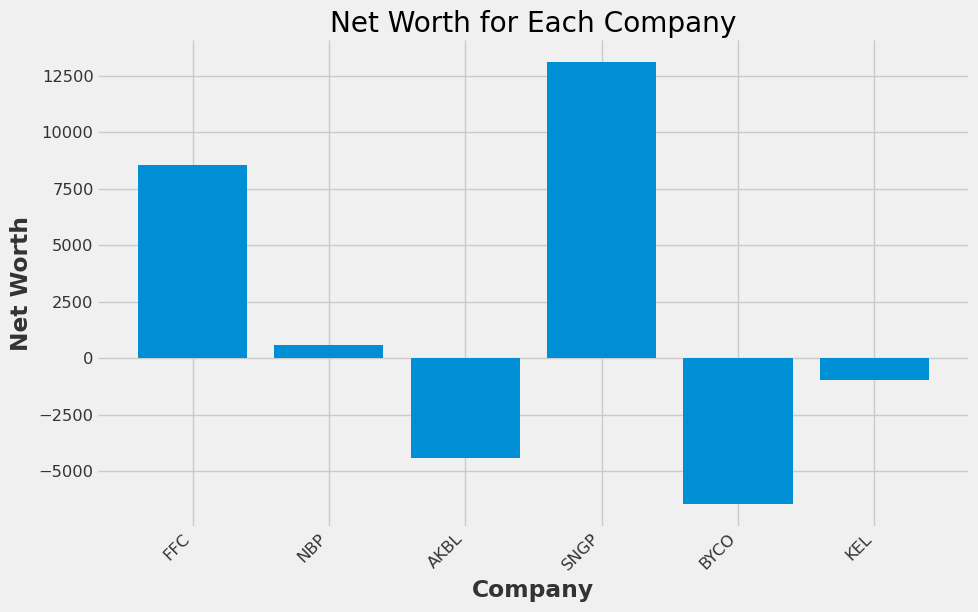

In [ ]:

visual.plot_networth(copy.deepcopy(companies))

In [ ]:
!pip install pykalman


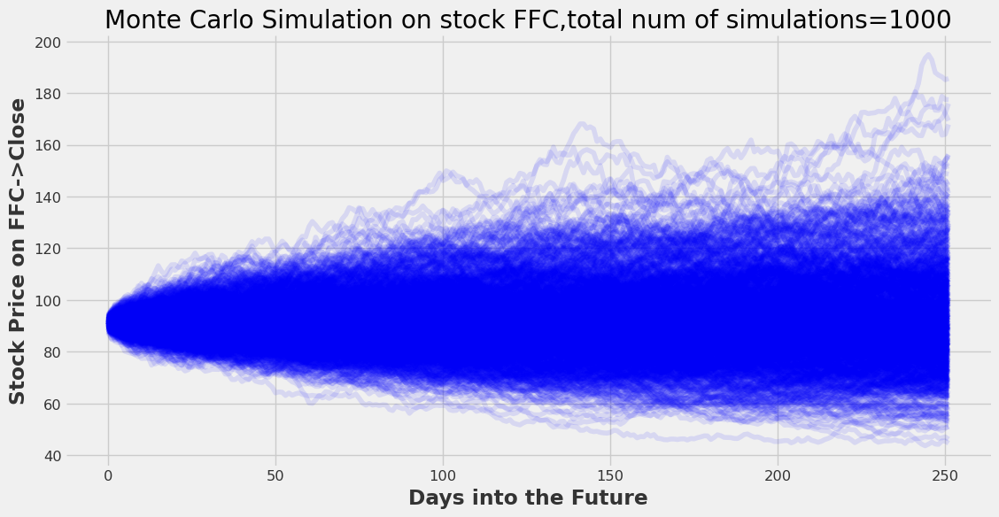

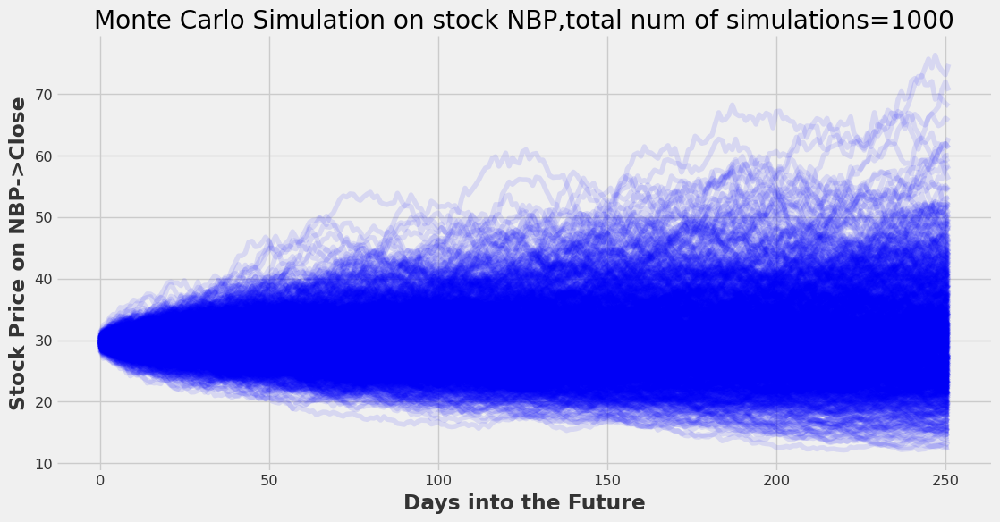

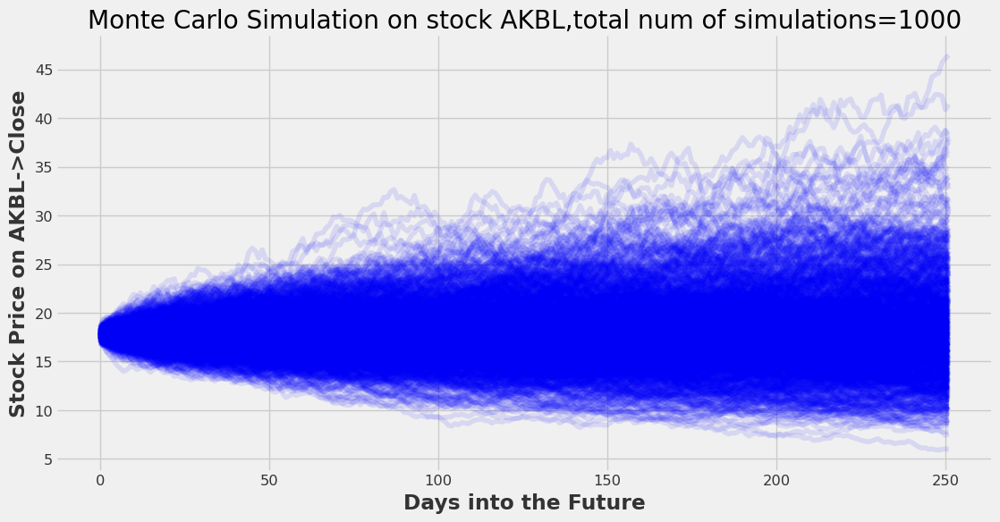

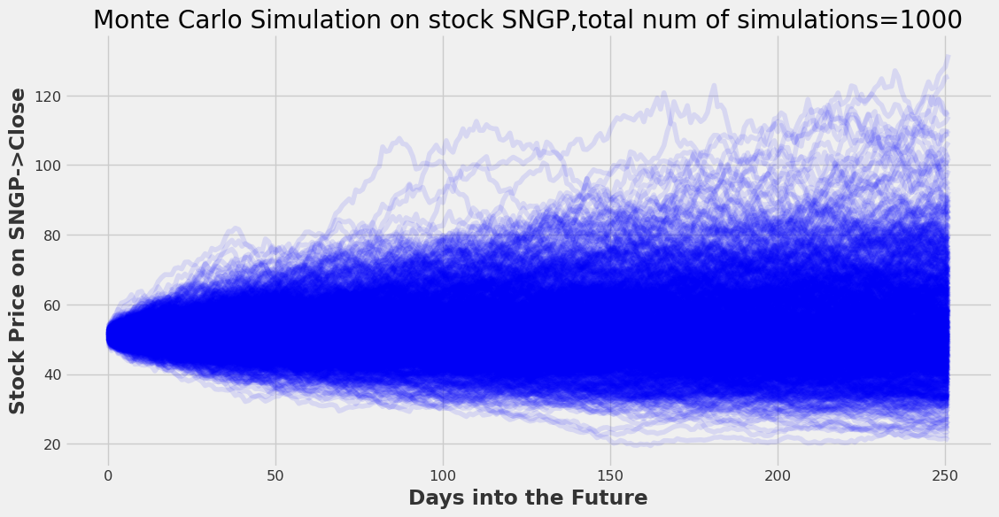

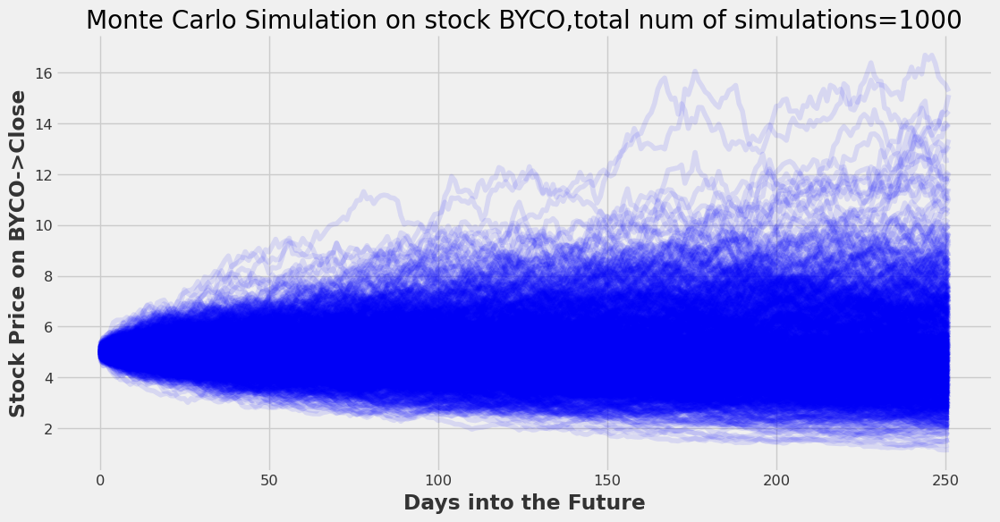

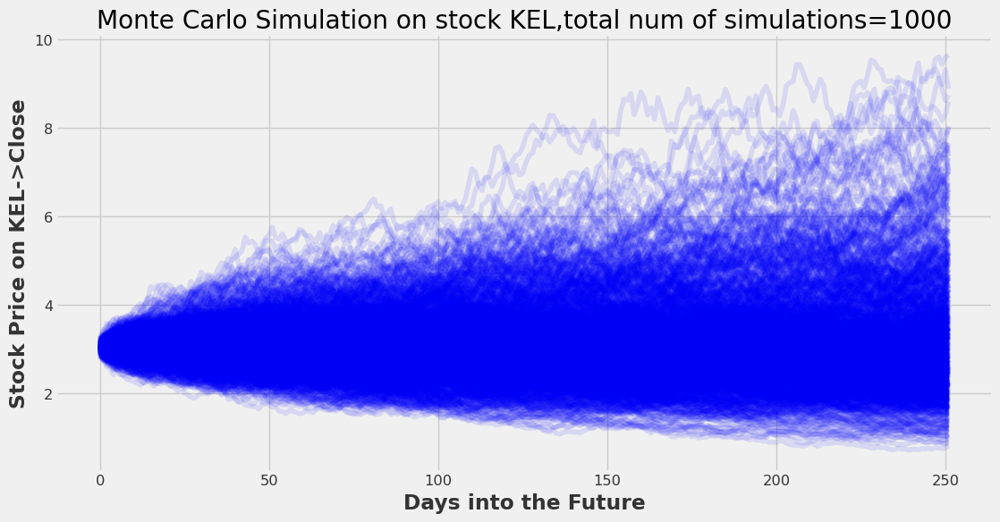

In [ ]:
''' What will be the max, and min price in the next n days, Monte carlos Simulations.'''
for key,df in companies.items():
  visual.plot_monte_carlos_simulation(copy.deepcopy(df),name=key,column="Close")


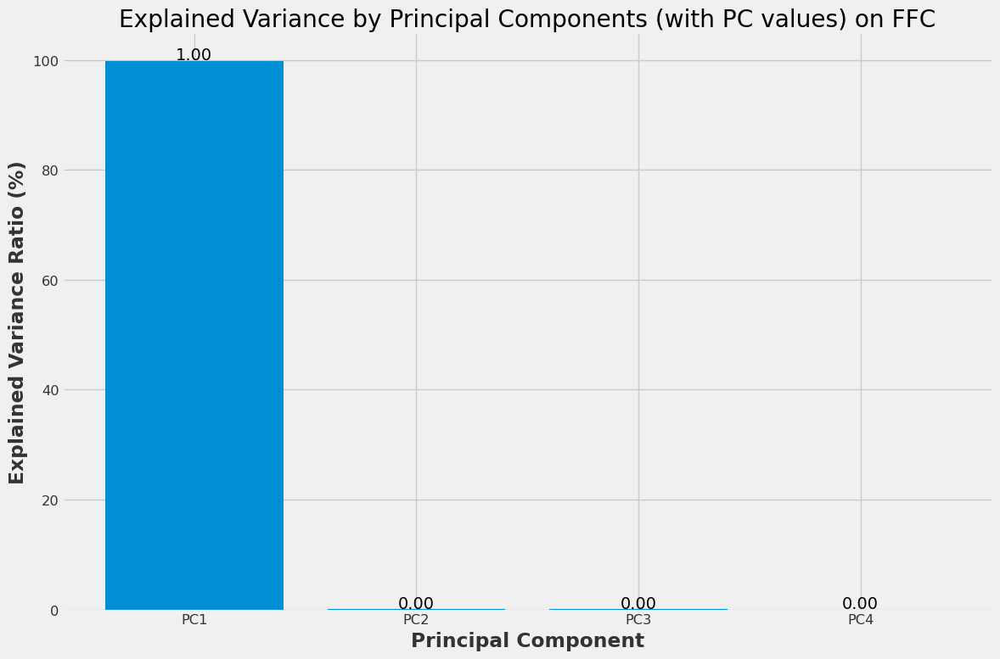

Explained Variance:
PC1: 0.9985
PC2: 0.0008
PC3: 0.0006
PC4: 0.0001

Component Loadings:
         Open      High       Low     Close
PC1  0.500001  0.657483 -0.166195 -0.538604
PC2  0.499949 -0.710169  0.184990 -0.459880
PC3  0.500026  0.202362  0.675441  0.502796
PC4  0.500024 -0.149753 -0.694218  0.495593


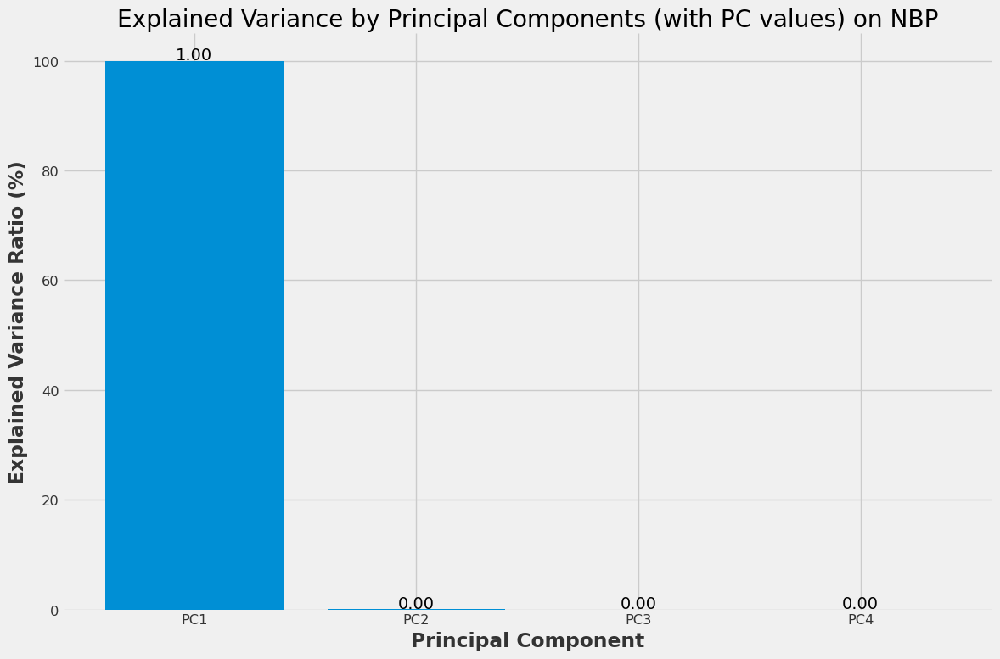

Explained Variance:
PC1: 0.9998
PC2: 0.0001
PC3: 0.0001
PC4: 0.0000

Component Loadings:
         Open      High       Low     Close
PC1  0.499985  0.722214  0.061767 -0.473927
PC2  0.499991 -0.689821  0.001014 -0.523598
PC3  0.500015 -0.048051  0.673665  0.542081
PC4  0.500009  0.015669 -0.736451  0.455396


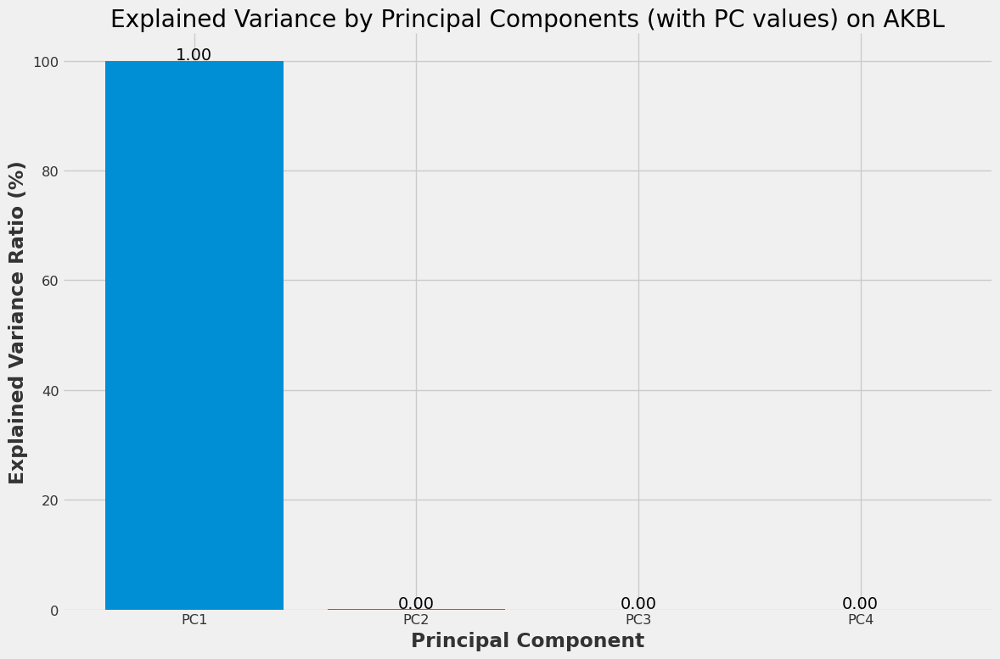

Explained Variance:
PC1: 0.9998
PC2: 0.0001
PC3: 0.0001
PC4: 0.0000

Component Loadings:
         Open      High       Low     Close
PC1  0.500000  0.598644 -0.034475 -0.624849
PC2  0.499969 -0.779878  0.128021 -0.354163
PC3  0.500017  0.182791  0.652533  0.539232
PC4  0.500014 -0.001611 -0.746072  0.439727


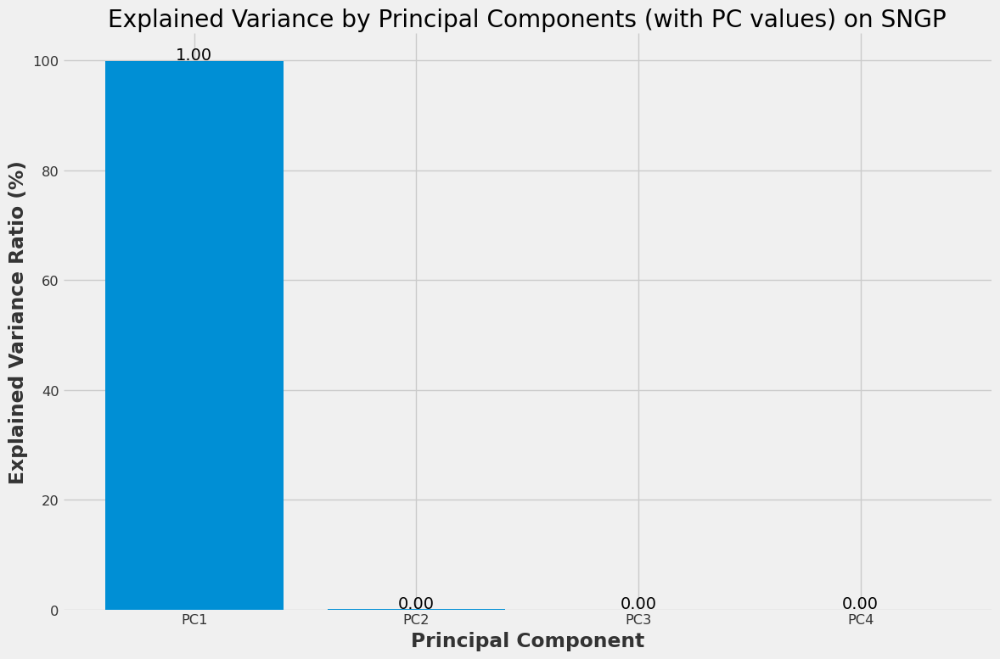

Explained Variance:
PC1: 0.9996
PC2: 0.0002
PC3: 0.0001
PC4: 0.0000

Component Loadings:
         Open      High       Low     Close
PC1  0.499971  0.719391  0.021585  0.481705
PC2  0.499978 -0.694232  0.043979  0.515879
PC3  0.500030 -0.002524  0.672712 -0.545364
PC4  0.500022 -0.022623 -0.738281 -0.452115


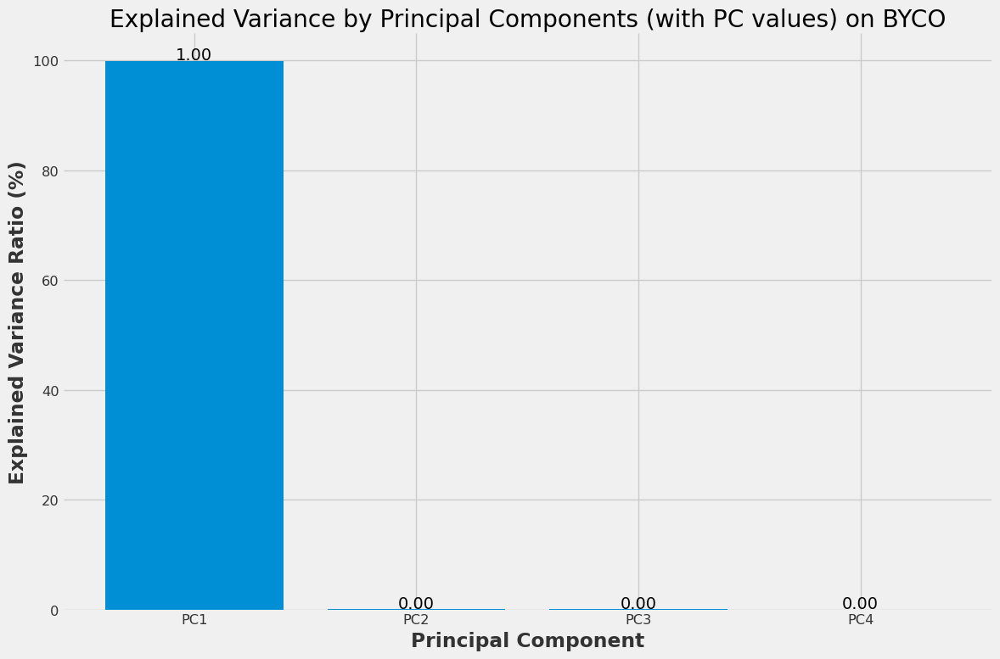

Explained Variance:
PC1: 0.9992
PC2: 0.0005
PC3: 0.0003
PC4: 0.0001

Component Loadings:
         Open      High       Low     Close
PC1  0.499954  0.701553  0.002471 -0.507802
PC2  0.499947 -0.712560 -0.004030 -0.492235
PC3  0.500049  0.002235  0.707878  0.498853
PC4  0.500050  0.008760 -0.706319  0.500987


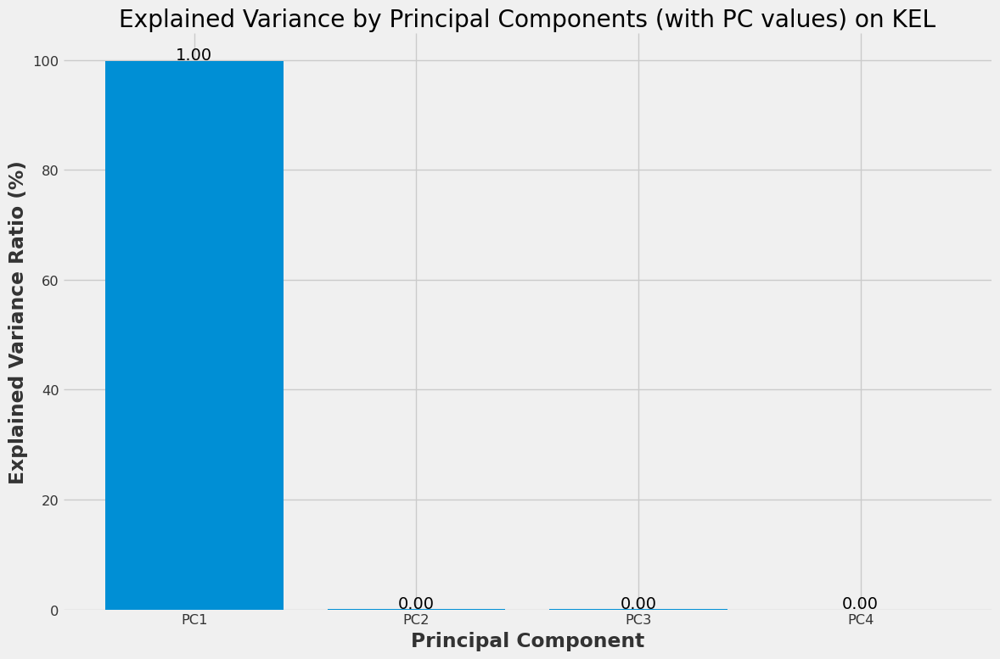

Explained Variance:
PC1: 0.9986
PC2: 0.0007
PC3: 0.0006
PC4: 0.0001

Component Loadings:
         Open      High       Low     Close
PC1  0.500014  0.659429 -0.067594  0.557288
PC2  0.499943 -0.740696  0.092678  0.439132
PC3  0.500026  0.121907  0.689785 -0.509224
PC4  0.500016 -0.040749 -0.714869 -0.487119


In [ ]:

for key,df in companies.items():
  visual.plot_pca_components(df,key)

In [ ]:
# timesplit="20180101"
# data_dict=get_item_series_items(companies,timesplit)
# #please turn on gpu and run atleast 120
# train_model_to_all_companies(data_dict,n_epochs=200)
# show_graph(data_dict,time_split=timesplit,path="/content")
# timesplit="20180101"
# data_dict=get_item_series_items_multivariate(companies,timesplit) ##multivariate
# #please turn on gpu and run atleast 120
# train_model_to_all_companies(data_dict,n_epochs=200)
# show_graph(data_dict,time_split=timesplit,path="/content")

<h2>how to find skewness, kurtosis, normality, expected and spread of a Company  A’s  closing price using probability density function?
</h2>

*   kurtosis for normal distribution is equal to 3
*   For a distribution having kurtosis < 3: It is called playkurtic.
*   For a distribution having kurtosis > 3, It is called leptokurtic and it signifies that it tries to produce more outliers rather than the normal distribution.


We can start by visualizing the distribution of the target variable, which in this case is the closing stock price. We can use a histogram to visualize the distribution.

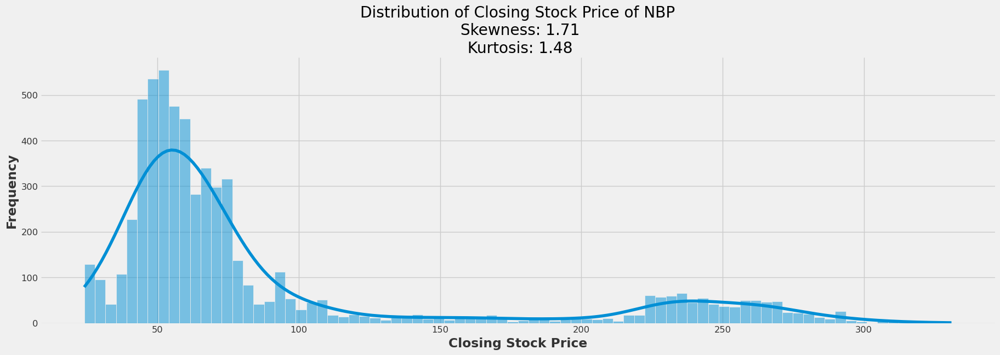

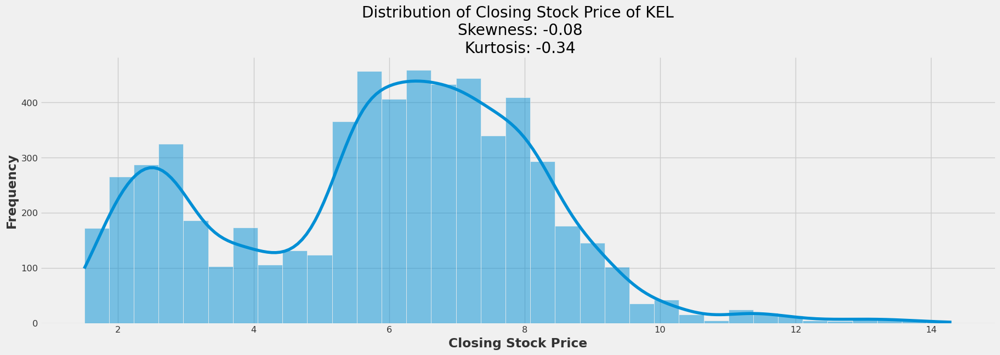

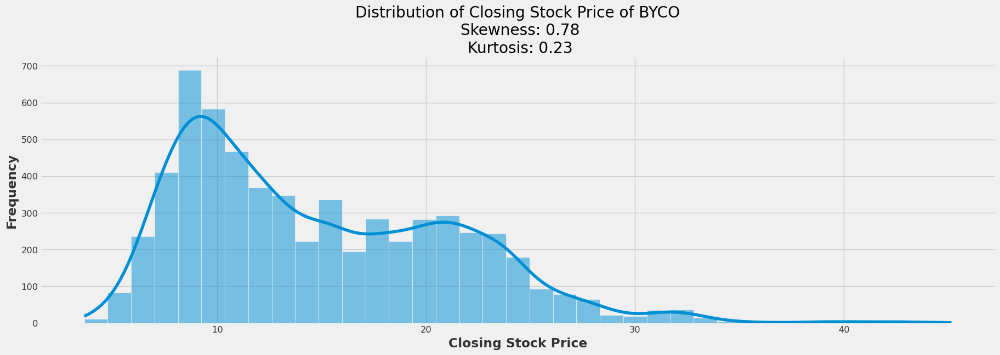

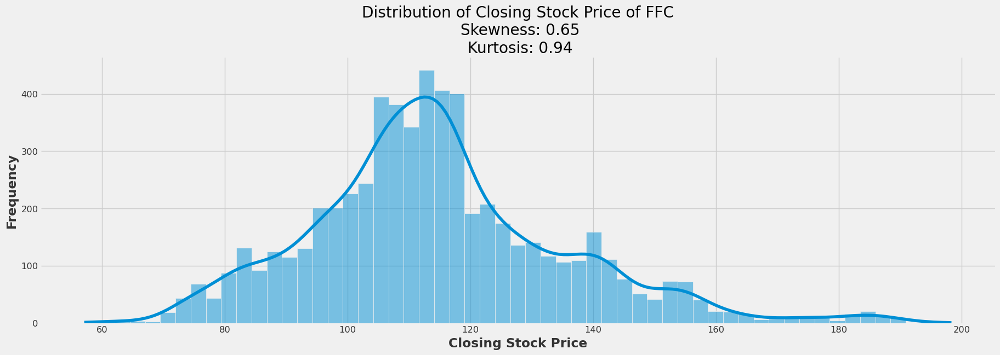

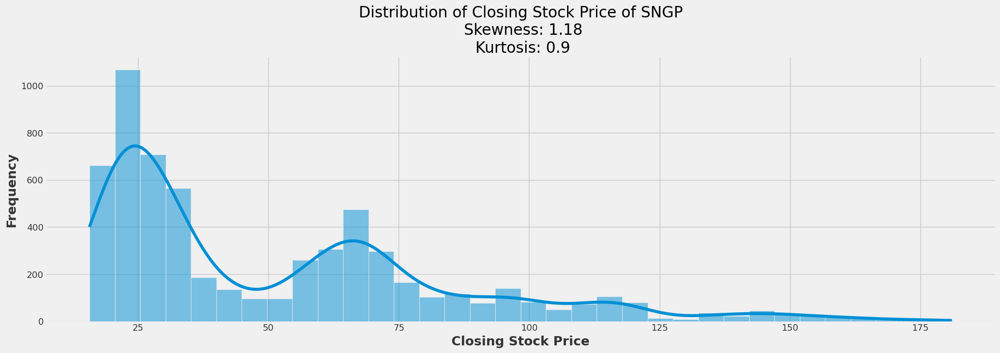

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew
import scipy


def getSkewnessKurtosis(mCompanies):
  for company in mCompanies:
    mCompany=companies[company]
    closing=mCompany['Close']
    skewness=skew(closing, axis=0, bias=True)
    kurtosis=scipy.stats.kurtosis(closing, axis=0, fisher=True, bias=True)
    plt.figure(figsize=(20, 6))
    sns.histplot(closing, kde=True)
    plt.title('Distribution of Closing Stock Price of '+company+"\n Skewness: "+str(round(skewness,2))+"\n Kurtosis: "+str(round(kurtosis,2)))
    plt.xlabel('Closing Stock Price')
    plt.ylabel('Frequency')
    plt.show()
    print()

getSkewnessKurtosis(["NBP","KEL","BYCO","FFC","SNGP"])

<h2>Calculate the probability density function (PDF) of the closing prices and visualize it.</h2>
Probability density function is a measurement of how often investment returns fall within a specified range. PDFs are typically depicted on a graph, with a normal bell curve indicating neutral market risk, and a skewed curve at either end indicating greater or lesser risk-reward.

It is used in investing, particularly in determining the possible performance of a stock, as well as in the risk management component of investing by helping to determine the maximum loss.

The closing price is the last price at which the stock is traded during the regular trading day. A stock’s closing price is the standard benchmark used by investors to track its performance over time.

We calculated the PDF for different stocks and visualized it using the python library.


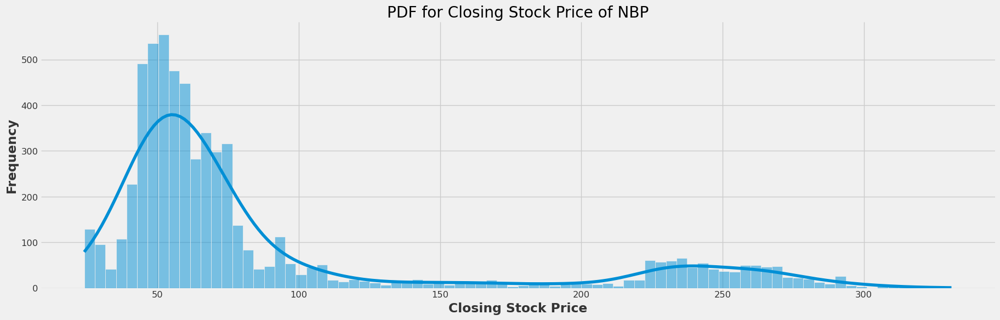

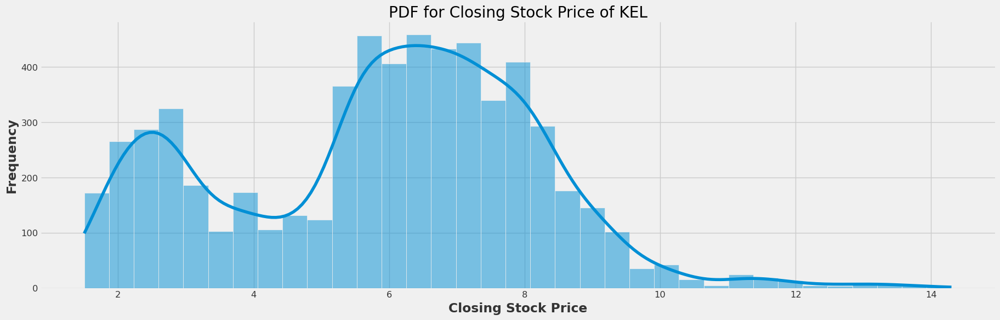

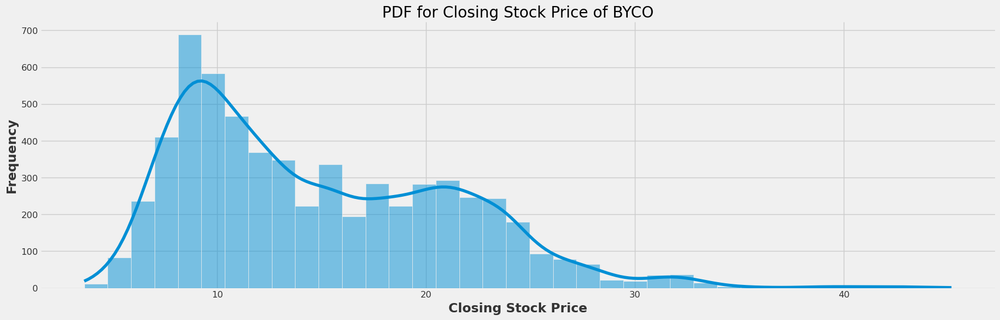

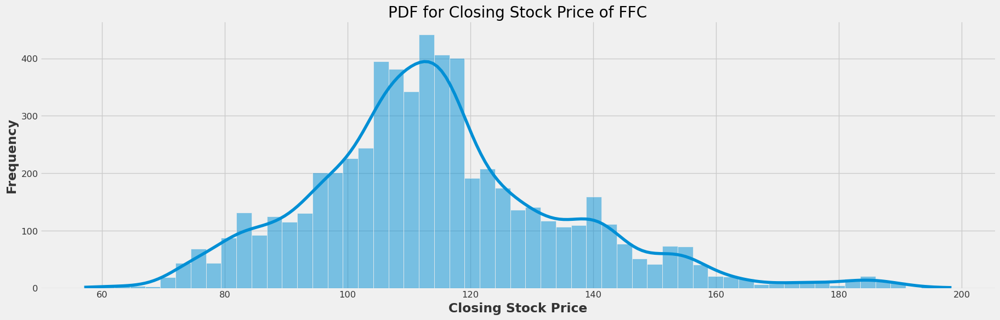

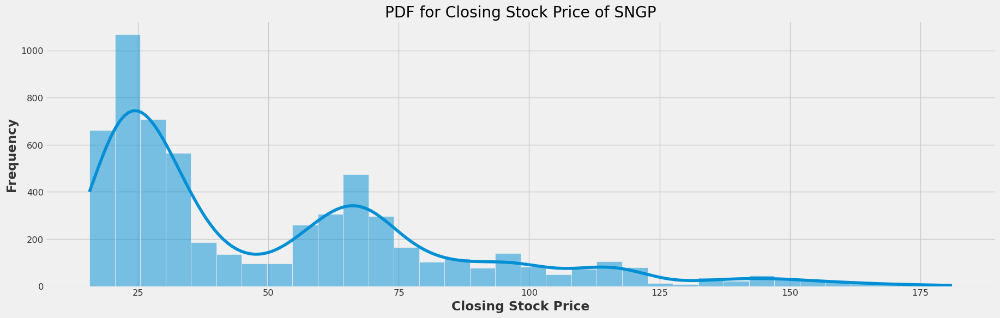

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew
import scipy


def getClosinfPricePDF(mCompanies):
  for company in mCompanies:
    closing=companies[company]['Close']
    plt.figure(figsize=(20, 6))
    sns.histplot(closing, kde=True)
    plt.title('PDF for Closing Stock Price of '+company)
    plt.xlabel('Closing Stock Price')
    plt.ylabel('Frequency')
    plt.show()
    print()

getClosinfPricePDF(["NBP","KEL","BYCO","FFC","SNGP"])

<br>
<h2>Outliers Detection</h2>
<br>
How to  identify outliers in any company  and visualize using a normal distribution?  (make a function so that we can give different company in the function )


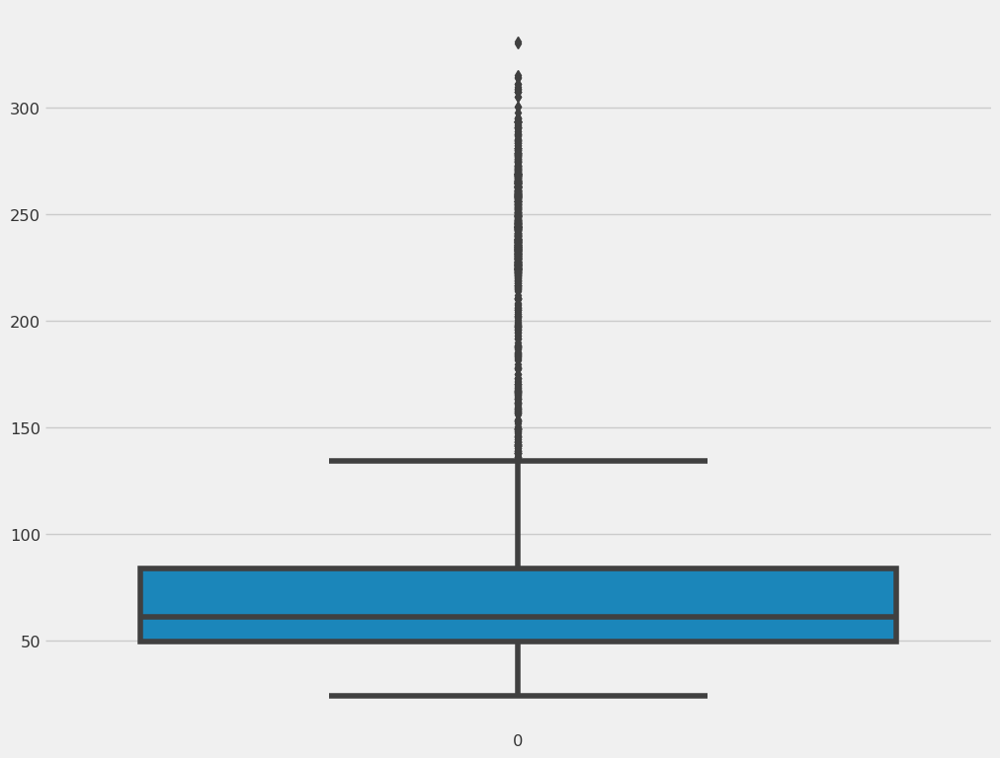

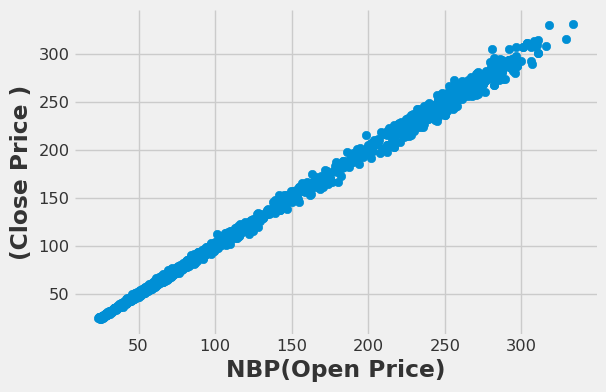

In [ ]:
import seaborn as sns

import matplotlib.pyplot as plt

companyList=["NBP","KEL","BYCO","FFC","SNGP"]

def getOutliersVisualBoxPlot(company):
  mCompany=companies[company]
  sns.boxplot(mCompany['Close'])

def getOutliersVisualScatter(company):
  fig, ax = plt.subplots(figsize=(6, 4))
  mCompany=companies[company]
  ax.scatter(mCompany['Open'], mCompany['Close'])
  ax.set_xlabel(company+'(Open Price)')
  ax.set_ylabel('(Close Price )')
  plt.show()


getOutliersVisualBoxPlot("NBP")
getOutliersVisualScatter("NBP")

In the above graph, can clearly see that values above 10 are acting as outliers.


<h2>How much value do we put at risk by investing in a particular stock?</h2>
There are many ways we can quantify risk, one of the most basic ways using the information we've gathered on by calculating the mean and standard deviation of returns and then computes value at risk by using the inverse of the cumulative distribution function (CDF) of the normal distribution.

Value at risk plot is attached for reference.


{'FFC': -0.04359761416940751, 'NBP': -0.05490915190005322, 'AKBL': -0.056328399058468745, 'SNGP': -0.05692673621282171, 'BYCO': -0.07485221055007188, 'KEL': -0.08178161419020594}


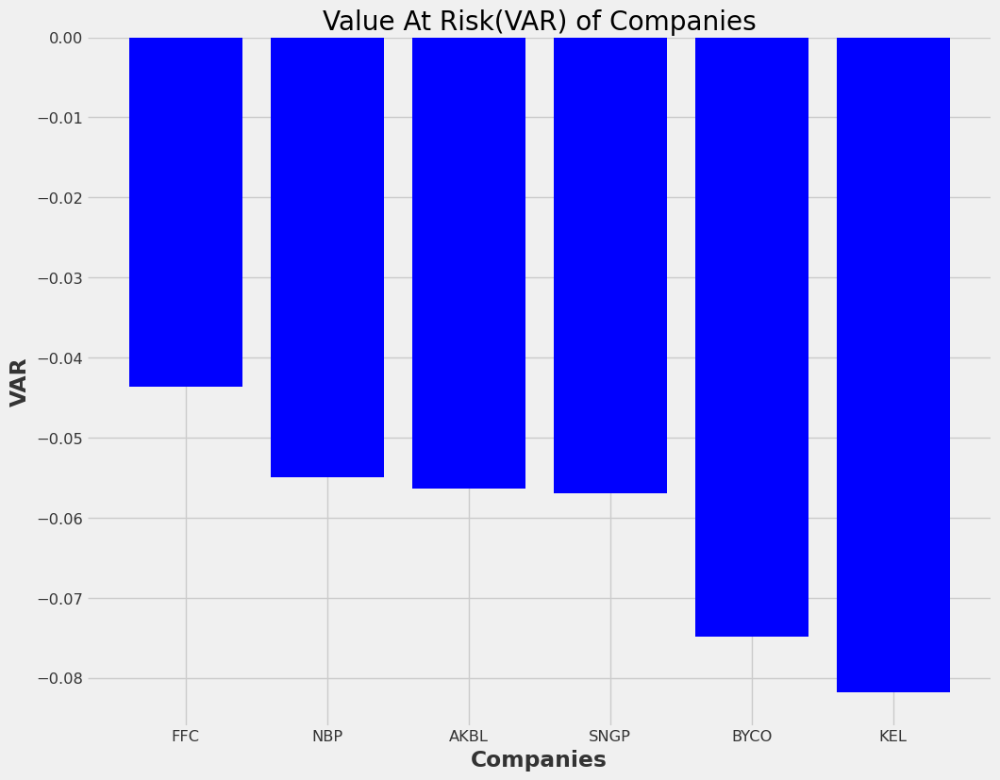

In [ ]:
import copy
def valueAtRisk(companies):
  import numpy as np
  import pandas as pd
  from scipy.stats import norm
  '''
  The function valueAtRisk calculates the mean and standard deviation of returns and then computes VaR
  using the inverse of the cumulative distribution function (CDF) of the normal distribution.
  '''

  val_at_risk_companies = {}

  for key, value in companies.items():
    companies[key]['Daily Returns'] =  companies[key]['Close'].pct_change().fillna(0)

    mean_return = np.mean(companies[key]['Daily Returns'])
    std_dev_return = np.std(companies[key]['Daily Returns'])

    # Calculate VaR using the inverse of the cumulative distribution function (CDF) of the normal distribution
    z_score = norm.ppf(1 - 0.999)

    val_at_risk_companies[key] = mean_return + (z_score * std_dev_return)


  return val_at_risk_companies


def plot_VAR(companies):

  plt.bar(companies.keys(), companies.values(), color='blue')
  plt.xlabel('Companies')
  plt.ylabel('VAR')
  plt.title('Value At Risk(VAR) of Companies')

  # Display the chart
  plt.show()


# Compute VaR
var = valueAtRisk(companies)
print(var)
plot_VAR(var)

<h2>How can we attempt to predict future stock behavior (make a function so that we can give different company in the function )</h2>

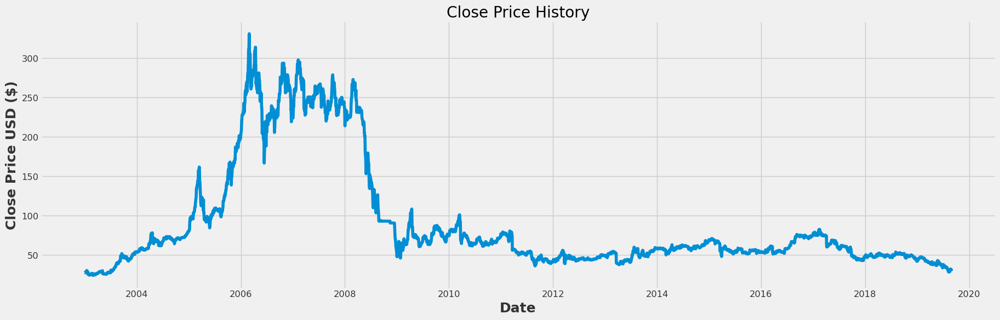

In [ ]:
mCompany=companies["NBP"]
plt.figure(figsize=(20,6))
plt.title('Close Price History')
plt.plot(mCompany['Close'])
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price USD ($)', fontsize=18)
plt.show()

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, LSTM

# Create a new dataframe with only the 'Close column
data = mCompany.filter(['Close'])
# Convert the dataframe to a numpy array
dataset = data.values
# Get the number of rows to train the model on
training_data_len = int(np.ceil( len(dataset) * .95 ))

training_data_len

5782

In [ ]:
# Scale the data

scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(dataset)

scaled_data



array([[0.01156729],
       [0.01140437],
       [0.01270772],
       ...,
       [0.02297165],
       [0.02290648],
       [0.0182144 ]])

[array([0.01156729, 0.01140437, 0.01270772, 0.01262626, 0.01262626,
       0.0125448 , 0.01238188, 0.01107853, 0.0133594 , 0.01449984,
       0.01523297, 0.01523297, 0.01596611, 0.01661779, 0.02036494,
       0.0200391 , 0.01824699, 0.01751385, 0.01751385, 0.01678071,
       0.01205604, 0.00765722, 0.00456175, 0.00651678, 0.00863473,
       0.00863473, 0.01075269, 0.00635386, 0.00521342, 0.00570218,
       0.00325839, 0.00211795, 0.00211795, 0.00097752, 0.00195503,
       0.00293255, 0.00439883, 0.00423591, 0.00350277, 0.00350277,
       0.00276963, 0.00423591, 0.00423591, 0.00423591, 0.00423591,
       0.00423591, 0.00423591, 0.00570218, 0.00733138, 0.00716846,
       0.0083089 , 0.0074943 , 0.00684262, 0.00684262, 0.00619094,
       0.00423591, 0.00325839, 0.        , 0.00211795, 0.00464321])]
[0.004643206256109464]

[array([0.01156729, 0.01140437, 0.01270772, 0.01262626, 0.01262626,
       0.0125448 , 0.01238188, 0.01107853, 0.0133594 , 0.01449984,
       0.01523297, 0.01523297, 0.0

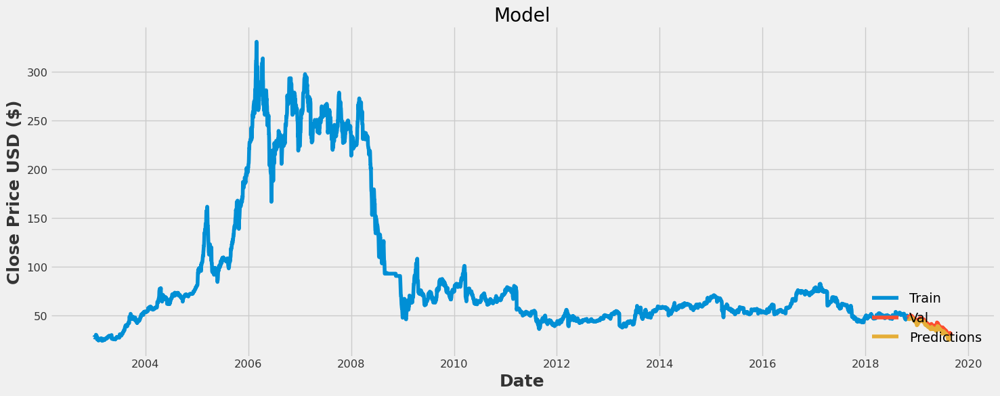

In [ ]:
# Create the training data set
# Create the scaled training data set
train_data = scaled_data[0:int(training_data_len), :]
# Split the data into x_train and y_train data sets
x_train = []
y_train = []

for i in range(60, len(train_data)):
    x_train.append(train_data[i-60:i, 0])
    y_train.append(train_data[i, 0])
    if i<= 61:
        print(x_train)
        print(y_train)
        print()

# Convert the x_train and y_train to numpy arrays
x_train, y_train = np.array(x_train), np.array(y_train)

# Reshape the data
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
# x_train.shape

# Build the LSTM model
model = Sequential()
model.add(LSTM(128, return_sequences=True, input_shape= (x_train.shape[1], 1)))
model.add(LSTM(64, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(x_train, y_train, batch_size=1, epochs=1)

# Create the testing data set
# Create a new array containing scaled values from index 1543 to 2002
test_data = scaled_data[training_data_len - 60: , :]
# Create the data sets x_test and y_test
x_test = []
y_test = dataset[training_data_len:, :]
for i in range(60, len(test_data)):
    x_test.append(test_data[i-60:i, 0])

# Convert the data to a numpy array
x_test = np.array(x_test)

# Reshape the data
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1 ))

# Get the models predicted price values
predictions = model.predict(x_test)
predictions = scaler.inverse_transform(predictions)

# Get the root mean squared error (RMSE)
rmse = np.sqrt(np.mean(((predictions - y_test) ** 2)))

# Plot the data
train = data[:training_data_len]
valid = data[training_data_len:]
valid['Predictions'] = predictions
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price USD ($)', fontsize=18)
plt.plot(train['Close'])
plt.plot(valid[['Close', 'Predictions']])
plt.legend(['Train', 'Val', 'Predictions'], loc='lower right')
plt.show()

In [ ]:
valid

,Close,Predictions
2018-10-31,48.18,46.752934
2018-11-01,48.07,46.609493
2018-11-02,48.83,46.422043
2018-11-03,48.55,46.467876
2018-11-04,48.55,46.533829
...,...,...
2019-08-26,31.35,28.174702
2019-08-27,31.85,28.087425
2019-08-28,31.15,28.051353
2019-08-29,31.13,27.882572


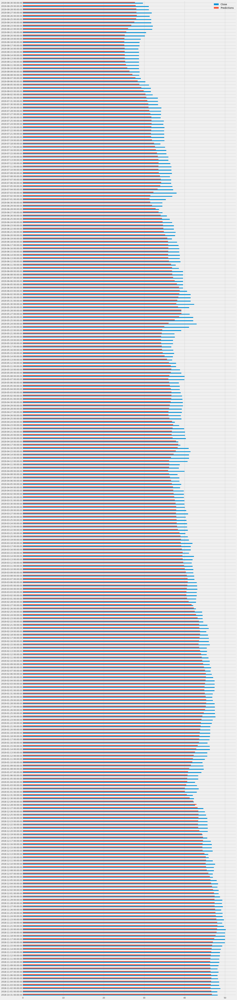

In [ ]:
ax = valid.plot.barh(figsize = (20, 100),rot=0)